In [1]:
# This is the import cell
import sys
import os
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.lines import Line2D
from matplotlib.ticker import MultipleLocator, FormatStrFormatter
from mpl_toolkits.axes_grid1.inset_locator import (inset_axes, InsetPosition,
                                                  mark_inset)
import matplotlib.ticker as ticker
from collections import OrderedDict
from scipy import stats
from PIL import Image
import matplotlib.gridspec as gridspec
import matplotlib.patches as patches
import pylab as plot
first = True
pd.set_option('display.max_columns', None)
pd.set_option("display.max_rows", 10)



# Here are my rc parameters for matplotlibf
fsize = 20
mpl.rc('font', serif='Helvetica Neue')
#mpl.rc('font', serif='Times New Roman')
mpl.rcParams.update({'font.size': fsize})
mpl.rcParams['figure.figsize'] = 3.2, 2.8
mpl.rcParams['figure.dpi'] = 500
mpl.rcParams['xtick.direction'] = 'in'
mpl.rcParams['ytick.direction'] = 'in'
mpl.rcParams['lines.linewidth'] = 1.5
mpl.rcParams['axes.linewidth'] = 1.5
# Set x tick params
mpl.rcParams['xtick.major.size'] = 4.5
mpl.rcParams['xtick.major.width'] = 1.5
mpl.rcParams['xtick.minor.size'] = 3.
mpl.rcParams['xtick.minor.width'] = 1.25
# Set y tick params
mpl.rcParams['ytick.major.size'] = 4.5
mpl.rcParams['ytick.major.width'] = 1.5
mpl.rcParams['ytick.minor.size'] = 3.
mpl.rcParams['ytick.minor.width'] = 1.25
mpl.rcParams['legend.fontsize']= 20.
mpl.rcParams['mathtext.fontset'] = 'stix'
mpl.rcParams["font.family"] = "Times New Roman"
# Load LaTeX and amsmath
# mpl.rc('text', usetex=True)
# mpl.rcParams['text.latex.preamble']=[r"\usepackage{amsmath}"]

In [2]:
# Get the current path
if first:
    parent = os.getcwd()
print(parent)
# Grab file names from data folder
dens = os.listdir('../fast_out_txt_files/radial')
try:
    data.remove('.DS_Store')
except:
    print(".DS_Store not in directory")
    
# Grab the MCS data
pres2 = os.listdir('../fast_out_txt_files/BubComp')
try:
    pres.remove('.DS_Store')
except:
    print(".DS_Store not in directory")

/Users/nicklauersdorf/hoomd-blue/build/njlauersdorf/ABPs/post_proc/Jupyter
.DS_Store not in directory
.DS_Store not in directory


In [3]:
# Some functions to get the relevant data from the filenames
def checkFile(fname, string):
    for i in range(len(fname)):
        if fname[i] == string[0]:
#             print"{} matches {}".format(fname[i], string[0])
            for j in range(1, len(string)):
                if (i + j) > (len(fname) - 1):
                    break
                elif fname[i + j] == string[j]:
#                     print"{} matches {}".format(fname[i+j], string[j])
                    if j == (len(string) - 1):
#                         print"Final match!"
                        return True
                else:
                    break
    return False
    
def txtValue(fname, string):
    out = ""
    index = 0
    for i in range(len(fname)):
        if fname[i] == string[0]:
            for j in range(1, len(string)):
                if (i + j) > (len(fname) - 1):
                    break
                elif fname[i + j] == string[j]:
                    if j == (len(string) - 1):
                        # Last index of search string
                        index = i + j
                else:
                    break
                        
    # First index of value
    index += 1
    mybool = True
    while mybool:
        if fname[index].isdigit():
            out = out + fname[index]
            index += 1
        elif fname[index] == ".":    
            if fname[index+1].isdigit():
                out = out + fname[index]
                index += 1
            else:
                mybool = False
        else:
            mybool = False
    return float(out)

# Sorting functions
def multiSort(arr1, arr2, arr3, arr4):
    """Sort an array the slow (but certain) way, returns original indices in sorted order"""
    # Doing this for PeR, PeS, xS in this case
    cpy1 = np.copy(arr1)
    cpy2 = np.copy(arr2)
    cpy3 = np.copy(arr3)
    cpy4 = np.copy(arr4)
    ind = np.arange(0, len(arr1))
    for i in range(len(cpy1)):
        for j in range(len(cpy1)):
            # Sort by first variable
            if cpy1[i] > cpy1[j] and i < j:
                # Swap copy array values
                cpy1[i], cpy1[j] = cpy1[j], cpy1[i]
                cpy2[i], cpy2[j] = cpy2[j], cpy2[i]
                cpy3[i], cpy3[j] = cpy3[j], cpy3[i]
                cpy4[i], cpy4[j] = cpy4[j], cpy4[i]
                # Swap the corresponding indices
                ind[i], ind[j] = ind[j], ind[i]
                
            # If first variable is equal, resort to second variable
            elif cpy1[i] == cpy1[j] and cpy2[i] > cpy2[j] and i < j:
                # Swap copy array values
                cpy1[i], cpy1[j] = cpy1[j], cpy1[i]
                cpy2[i], cpy2[j] = cpy2[j], cpy2[i]
                cpy3[i], cpy3[j] = cpy3[j], cpy3[i]
                cpy4[i], cpy4[j] = cpy4[j], cpy4[i]
                # Swap the corresponding indices
                ind[i], ind[j] = ind[j], ind[i]
                
            elif cpy1[i] == cpy1[j] and cpy2[i] == cpy2[j] and cpy3[i] > cpy3[j] and i < j:
                # Swap copy array values
                cpy1[i], cpy1[j] = cpy1[j], cpy1[i]
                cpy2[i], cpy2[j] = cpy2[j], cpy2[i]
                cpy3[i], cpy3[j] = cpy3[j], cpy3[i]
                cpy4[i], cpy4[j] = cpy4[j], cpy4[i]
                # Swap the corresponding indices
                ind[i], ind[j] = ind[j], ind[i]
            elif cpy1[i] == cpy1[j] and cpy2[i] == cpy2[j] and cpy3[i] == cpy3[j] and cpy4[i] > cpy4[j] and i < j:
                # Swap copy array values
                cpy1[i], cpy1[j] = cpy1[j], cpy1[i]
                cpy2[i], cpy2[j] = cpy2[j], cpy2[i]
                cpy3[i], cpy3[j] = cpy3[j], cpy3[i]
                cpy4[i], cpy4[j] = cpy4[j], cpy4[i]
                # Swap the corresponding indices
                ind[i], ind[j] = ind[j], ind[i]
    return ind

def indSort(arr1, arr2):
    """Take sorted index array, use to sort array"""
    # arr1 is array to sort
    # arr2 is index array
    cpy = np.copy(arr1)
    for i in range(len(arr1)):
        arr1[i] = cpy[arr2[i]]

In [4]:
# Grab parameters, sort them
chkStrings = ["pe", "pa", "pb", "xa", "eps", "phi", "cluster", "dtau"]
default = [0., 0., 0., 100., 1., 60., 0, 0.000001]
storeVals = [[] for i in chkStrings]
for i in dens:
    for j in range(0, len(chkStrings)):
        if chkStrings[j] != "cluster":
            if checkFile(i, chkStrings[j]):
                storeVals[j].append(txtValue(i, chkStrings[j]))
            else:
                storeVals[j].append(default[j])  
        else:
            if checkFile(i, chkStrings[j]):
                storeVals[j].append(1)
            else:
                storeVals[j].append(default[j]) 
                
# Issue with epsilon in file output 0 -> 0.0001
for i in range(0, len(storeVals[4])):
    if storeVals[4][i] == 0.0:
        storeVals[4][i] = 0.0001

# Sort the arrays
if len(storeVals[0]) > 1:
    # Sort them!
#     print("Sorting... ")
    # Sort by: pe, phi, epsilon, cluster
    indArr = multiSort(storeVals[chkStrings.index("pa")],
                       storeVals[chkStrings.index("phi")],
                       storeVals[chkStrings.index("eps")],
                       storeVals[chkStrings.index("cluster")])
    indSort(dens, indArr)
    for i in storeVals:
        indSort(i, indArr)
    
# Now that the data is sorted, read it into a dataframe
all_dens = []
os.chdir(parent)
os.chdir('../fast_out_txt_files/radial')
for i in dens:
#     print(i)
    df = pd.read_csv(i, sep='\s+', header=0)
    all_dens.append(df)
os.chdir(parent)

# This is how you access the data at different levels
display(all_dens[0])

,tauB,sizeBin,clust_size,interface_id,bub_id,r_min,r_max,align,alignA,alignB,num_dens,num_densA,num_densB,press,pressA,pressB
0,0.0,5.016308,2,1,0,0.000000,3.045615,-0.246631,-0.246631,NaN,1.544232,1.544232,0.000000,0.000000,0.0,0.000000
1,0.0,5.016308,2,1,0,3.045615,6.091230,0.110795,0.110795,NaN,1.624303,1.624303,0.000000,0.000000,0.0,0.000000
2,0.0,5.016308,2,1,0,6.091230,9.136846,-0.002437,-0.002437,NaN,1.606001,1.606001,0.000000,0.000000,0.0,0.000000
3,0.0,5.016308,2,1,0,9.136846,12.182461,-0.041497,-0.041497,NaN,1.583451,1.583451,0.000000,0.000000,0.0,0.000000
4,0.0,5.016308,2,1,0,12.182461,15.228076,-0.009793,-0.009793,NaN,1.574735,1.574735,0.000000,0.000000,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83953,199.8,5.016308,122,1,0,112.687764,115.733379,0.012199,0.028466,-0.018661,0.489121,0.320285,0.168836,-1.102714,0.0,-1.102714
83954,199.8,5.016308,122,1,0,115.733379,118.778994,0.004761,0.008972,-0.002600,0.491124,0.312412,0.178712,-0.162626,0.0,-0.162626
83955,199.8,5.016308,122,1,0,118.778994,121.824610,0.006289,0.006226,0.006409,0.482600,0.316231,0.166369,0.373187,0.0,0.373187
83956,199.8,5.016308,122,1,0,121.824610,124.870225,0.013650,0.015671,0.009932,0.494408,0.320285,0.174123,0.605278,0.0,0.605278


In [5]:
# Grab the parameters from each file, store in a dataframe
headers = ['pe', 'peA', 'peB', 'xA', 'eps', 'phi', 'tauPer_dt']
params = pd.DataFrame(columns=headers)
for i in range(0, len(all_dens)):
    pe = int(storeVals[chkStrings.index("pe")][i])
    pa = int(storeVals[chkStrings.index("pa")][i])
    pb = int(storeVals[chkStrings.index("pb")][i])
    xa = float(storeVals[chkStrings.index("xa")][i])
    ep = float(storeVals[chkStrings.index("eps")][i])
    phi = float(storeVals[chkStrings.index("phi")][i])
    dtau = float(storeVals[chkStrings.index("dtau")][i])
    df = pd.DataFrame([[pe, pa, pb, xa, ep, phi, dtau]], columns=headers)
    params = params.append(df, ignore_index = True)
display(params)

,pe,peA,peB,xA,eps,phi,tauPer_dt
0,0,0,350,50.0,1.0,60.0,0.000001
1,0,0,450,50.0,1.0,60.0,0.000001
2,0,0,200,50.0,1.0,60.0,0.000001
3,0,0,250,50.0,1.0,60.0,0.000001
4,0,50,450,50.0,1.0,60.0,0.000001
...,...,...,...,...,...,...,...
23,0,250,350,50.0,1.0,60.0,0.000001
24,0,250,450,50.0,1.0,60.0,0.000001
25,0,350,350,50.0,1.0,60.0,0.000001
26,0,350,450,50.0,1.0,60.0,0.000001


In [6]:
# Let's add columns to the time-resolved simulation data
for i in range(len(all_dens)):
    # Ger rid of NaN in favor of 0
    all_dens[i].fillna(0, inplace=True)

headers=list(all_dens[0])
display(all_dens[0])
print(all_dens[0][headers[1]][0])
print(all_dens[0][headers[2]][0])

,tauB,sizeBin,clust_size,interface_id,bub_id,r_min,r_max,align,alignA,alignB,num_dens,num_densA,num_densB,press,pressA,pressB
0,0.0,5.016308,2,1,0,0.000000,3.045615,-0.246631,-0.246631,0.000000,1.544232,1.544232,0.000000,0.000000,0.0,0.000000
1,0.0,5.016308,2,1,0,3.045615,6.091230,0.110795,0.110795,0.000000,1.624303,1.624303,0.000000,0.000000,0.0,0.000000
2,0.0,5.016308,2,1,0,6.091230,9.136846,-0.002437,-0.002437,0.000000,1.606001,1.606001,0.000000,0.000000,0.0,0.000000
3,0.0,5.016308,2,1,0,9.136846,12.182461,-0.041497,-0.041497,0.000000,1.583451,1.583451,0.000000,0.000000,0.0,0.000000
4,0.0,5.016308,2,1,0,12.182461,15.228076,-0.009793,-0.009793,0.000000,1.574735,1.574735,0.000000,0.000000,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83953,199.8,5.016308,122,1,0,112.687764,115.733379,0.012199,0.028466,-0.018661,0.489121,0.320285,0.168836,-1.102714,0.0,-1.102714
83954,199.8,5.016308,122,1,0,115.733379,118.778994,0.004761,0.008972,-0.002600,0.491124,0.312412,0.178712,-0.162626,0.0,-0.162626
83955,199.8,5.016308,122,1,0,118.778994,121.824610,0.006289,0.006226,0.006409,0.482600,0.316231,0.166369,0.373187,0.0,0.373187
83956,199.8,5.016308,122,1,0,121.824610,124.870225,0.013650,0.015671,0.009932,0.494408,0.320285,0.174123,0.605278,0.0,0.605278


5.016308
2


In [7]:
# Grab parameters, sort them
chkStrings = ["pe", "pa", "pb", "xa", "eps", "phi", "cluster", "dtau"]
default = [0., 0., 0., 100., 1., 60., 0, 0.000001]
storeVals = [[] for i in chkStrings]
for i in pres2:
    for j in range(0, len(chkStrings)):
        if chkStrings[j] != "cluster":
            if checkFile(i, chkStrings[j]):
                storeVals[j].append(txtValue(i, chkStrings[j]))
            else:
                storeVals[j].append(default[j])  
        else:
            if checkFile(i, chkStrings[j]):
                storeVals[j].append(1)
            else:
                storeVals[j].append(default[j]) 

# Issue with epsilon in file output 0 -> 0.0001
for i in range(0, len(storeVals[4])):
    if storeVals[4][i] == 0.0:
        storeVals[4][i] = 0.0001

# Sort the arrays
if len(storeVals[0]) > 1:
    # Sort them!
#     print("Sorting... ")
    # Sort by: pe, phi, epsilon, cluster
    indArr = multiSort(storeVals[chkStrings.index("pa")],
                       storeVals[chkStrings.index("phi")],
                       storeVals[chkStrings.index("eps")],
                       storeVals[chkStrings.index("cluster")])
    indSort(pres2, indArr)
    for i in storeVals:
        indSort(i, indArr)
    
# Now that the data is sorted, read it into a dataframe
all_pres_new = []
os.chdir(parent)
os.chdir('../fast_out_txt_files/BubComp')
for i in pres2:
#     print(i)
    df = pd.read_csv(i, sep='\s+', header=0)
    all_pres_new.append(df)
os.chdir(parent)

# This is how you access the data at different levels
display(all_pres_new[-1])
print(storeVals)

,tauB,sizeBin,clust_size,int_id,bub_id,Na,Nb,radius,radius_err,sa_ext,sa_int,edge_width,edge_width_err,NBin
0,0.0,5.016308,45357,1,1,7942,20742,93.612591,1.803694,607.132049,396.498974,35.559082,4.617106,799


[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 50.0, 50.0, 50.0, 50.0, 50.0, 100.0, 100.0, 100.0, 100.0, 100.0, 150.0, 150.0, 150.0, 150.0, 150.0, 200.0, 200.0, 200.0, 250.0, 250.0, 250.0, 350.0, 350.0, 450.0], [450.0, 350.0, 200.0, 250.0, 150.0, 450.0, 350.0, 200.0, 250.0, 200.0, 250.0, 150.0, 100.0, 450.0, 150.0, 450.0, 350.0, 250.0, 200.0, 350.0, 200.0, 450.0, 450.0, 350.0, 250.0, 450.0, 350.0, 450.0], [50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0, 50.0], [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], [60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0, 60.0,

In [8]:
# Grab the parameters from each file, store in a dataframe
headers = ['pe', 'peA', 'peB', 'xA', 'eps', 'phi', 'tauPer_dt']
params3 = pd.DataFrame(columns=headers)
for i in range(0, len(all_pres_new)):
    pe = int(storeVals[chkStrings.index("pe")][i])
    pa = int(storeVals[chkStrings.index("pa")][i])
    pb = int(storeVals[chkStrings.index("pb")][i])
    xa = float(storeVals[chkStrings.index("xa")][i])
    ep = float(storeVals[chkStrings.index("eps")][i])
    phi = float(storeVals[chkStrings.index("phi")][i])
    dtau = float(storeVals[chkStrings.index("dtau")][i])
    df = pd.DataFrame([[pe, pa, pb, xa, ep, phi, dtau]], columns=headers)
    params3 = params3.append(df, ignore_index = True)
display(params3)

,pe,peA,peB,xA,eps,phi,tauPer_dt
0,0,0,450,50.0,1.0,60.0,0.000001
1,0,0,350,50.0,1.0,60.0,0.000001
2,0,0,200,50.0,1.0,60.0,0.000001
3,0,0,250,50.0,1.0,60.0,0.000001
4,0,50,150,50.0,1.0,60.0,0.000001
...,...,...,...,...,...,...,...
23,0,250,350,50.0,1.0,60.0,0.000001
24,0,250,250,50.0,1.0,60.0,0.000001
25,0,350,450,50.0,1.0,60.0,0.000001
26,0,350,350,50.0,1.0,60.0,0.000001


In [9]:
# Let's add columns to the time-resolved simulation data
for i in range(len(all_pres_new)):
    # Ger rid of NaN in favor of 0
    all_pres_new[i].fillna(0, inplace=True)

headers=list(all_pres_new[0])
display(all_pres_new[0])
print(all_pres_new[0][headers[1]][0])
print(all_pres_new[0][headers[2]][0])

,tauB,sizeBin,clust_size,int_id,bub_id,Na,Nb,radius,radius_err,sa_ext,sa_int,edge_width,edge_width_err,NBin
0,0.0,5.016308,41139,1,1,7215,16908,96.659862,25.753825,605.782830,264.723890,59.983846,37.810336,735
1,0.0,5.016308,41139,1,4,381,0,4.934989,2.004667,39.953097,0.000000,4.934989,2.004667,10
2,0.1,5.016308,41792,1,1,7482,17303,81.282826,1.619145,547.460364,334.526603,29.462453,2.661090,599
3,0.2,5.016308,42974,1,1,7145,18599,82.548421,1.750547,541.643972,336.857444,30.257661,3.087644,618
4,0.3,5.016308,43891,1,1,6345,19444,84.131052,1.538991,547.471316,353.164951,29.970413,3.073389,630
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2425,199.6,5.016308,29329,2,2,8233,12217,85.392254,33.902297,640.034515,31.148915,80.459086,34.082596,631
2426,199.7,5.016308,29313,2,2,7314,11535,73.750435,9.264125,559.178240,323.630541,27.399418,15.970234,528
2427,199.7,5.016308,29313,2,3,88,63,3.405547,1.833391,28.337257,0.000000,3.405547,1.833391,12
2428,199.8,5.016308,29289,1,1,7388,11725,75.171986,9.496729,558.490900,319.153571,29.440442,15.274792,560


5.016308
41139


In [10]:
# All data is loaded, now compute analytical aspects
r_cut = (2.**(1./6.))

# Get lattice spacing for particle size
def ljForce(r, eps, sigma=1.):
    div = (sigma/r)
    dU = (24. * eps / sigma) * ((2*(div**13)) - (div)**7)
    return dU

# # Lennard-Jones pressure
# def ljPress(r, eps, sigma=1.):
#     phiCP = np.pi / (2. * np.sqrt(3.))
#     div = (sigma/r)
#     dU = (24. * eps / r) * ((2.*(div**12.)) - (div)**6.)
#     # This is just pressure divided by the area of a particle
# #     return (12. * dU / (np.pi * r))
#     return (12. * dU / (np.pi * r * phiCP))

def ljPress(r, pe, eps, sigma=1.):
    phiCP = np.pi / (2. * np.sqrt(3.))
    # This is off by a factor of 1.2...
    ljF = avgCollisionForce(pe)
    return (2. *np.sqrt(3) * ljF / r)
    
def avgCollisionForce(pe, power=1.):
    '''Computed from the integral of possible angles'''
    peCritical = 40.
    if pe < peCritical:
        pe = 0
    else:
        pe -= peCritical
    magnitude = 6.
    # A vector sum of the six nearest neighbors
    magnitude = np.sqrt(28)
#     return (magnitude * (pe**power)) / (np.pi)
#     return (pe * (1. + (8./(np.pi**2.))))
    coeff = 1.92#2.03#3.5#2.03
    #coeff= 0.4053
    return (pe * coeff)

def fStar(pe, epsilon, sigma=1.):
    out = (avgCollisionForce(pe) * sigma) / (24.*epsilon)
    return out
    
def conForRClust(pe, eps):
    out = []
    r = 1.112
    skip = [0.1, 0.01, 0.001, 0.0001, 0.00001, 0.000001, 0.0000001, 0.00000001]
    for j in skip:
        while ljForce(r, eps) < avgCollisionForce(pe):
            r -= j
        r += j
    out = r
    return out

def nonDimFLJ(r, sigma=1.):
    div = (sigma/r)
    dU = ((2*(div**13)) - (div)**7)
    return dU

def latForFStar(fstar):
    r = 1.112
    skip = [0.1, 0.01, 0.001, 0.0001, 0.00001, 0.000001, 0.0000001, 0.00000001]
    for j in skip:
        while nonDimFLJ(r) < fstar:
            r -= j
        r += j
    out = r
    return out
    
def latToPhi(latIn):
    '''Read in lattice spacing, output phi'''
    phiCP = np.pi / (2. * np.sqrt(3.))
    return phiCP / (latIn**2)

# From area fraction, get lattice spacing
def phiToLat(phiIn):
    '''Read in phi, output the lattice spacing'''
    phiCP = np.pi / (2. * np.sqrt(3.))
    latCP = 1.
    return np.sqrt(phiCP / phiIn)
    
def compPhiG(pe, a, kap=4.5, sig=1.):
    num = 3. * (np.pi**2) * kap * sig
    den = 4. * pe * a
    return num / den
    
def clustFrac(phi, phiG, a, sig=1.):
    phiL = latToPhi(a)
    ApL = np.pi * (sig**2) / 4.
    Ap = np.pi * (sig**2) / 4.
    num = (phiL*phiG) - (phiL*phi)
    den = (phi*phiG) - (phi*phiL)
    ans = num / den
    return ans

def radCurve(area):
    # From area of circle get curvature
    return np.sqrt(area/np.pi)

def radCirc(circ):
    return circ / (2. * np.pi)

In [11]:
# Let's use analytical theory and kinetic theory to get cluster radius
epsRange = [1., 0.1, 0.01, 0.001, 0.0001]
# epsRange = [0.0001, 0.001, 0.01, 0.1, 1.]
peRange = np.arange(0., 700., 1.)
phiRange = [0.45, 0.55, 0.65]
N = 100000.
norm = 10.**0.
# norm = 1.

phiCP = np.pi / (2. * np.sqrt(3))
lat = []
pColl = []
pLJ = []
cfs = []
Rls = []
peCrit = []
phiGs = []
phiCPs = []
a_box = []
l_box = []
for b in range(0, len(phiRange)):
    lat.append([])
    phiCPs.append([])
    pColl.append([])
    pLJ.append([])
    cfs.append([])
    Rls.append([])
    phiGs.append([])
    peCrit.append([])
    a_box.append(N * np.pi * 0.25 / phiRange[b])
    l_box.append(np.sqrt(a_box[-1]))
    for i in range(0, len(epsRange)):
        lat[b].append([])
        phiCPs[b].append([])
        pColl[b].append([])
        pLJ[b].append([])
        cfs[b].append([])
        Rls[b].append([])
        phiGs[b].append([])
        for j in range(0, len(peRange)):
            # Compute lattice spacing
        
            lat[b][i].append(conForRClust(peRange[j], epsRange[i]))
            phiCPs[b][i].append(latToPhi(lat[b][i][-1]))
            # Compute pressure
            #curPLJ = ljPress(lat[b][i][-1], epsRange[i]) / (np.pi * (lat[b][i][-1]**2) * 0.25 * phiCP)
            #curPLJ = ljPress(lat[b][i][-1], epsRange[i]) / (np.pi * (lat[b][i][-1]**2) * 0.25 * phiCP * (lat[b][i][-1]**(0.5)) * 1.25)
            curPLJ = ljPress(lat[b][i][-1], peRange[j], epsRange[i])
            
            # Append to list
            pLJ[b][i].append(curPLJ/(norm))

            # Compute cluster fraction
            phiG = compPhiG(peRange[j], lat[b][i][-1])
            phiGs[b][i].append(phiG)
            if peRange[j] > 35.:
                cf = clustFrac(phiRange[b], phiG, lat[b][i][-1])
                if cf < 0. or cf > 1.:
                    cf = 0.
            else:
                cf = 0
            cfs[b][i].append(cf)

            # Get the critical activity
            if j > 0:
                if cfs[b][i][-2] == 0. and cfs[b][i][-1] > 0.:
                    peCrit[b].append(peRange[j])

            # Get the radius (for some N)
            Nl = cfs[b][i][-1] * N
            Al = Nl * ((np.pi * (lat[b][i][-1]**2))/(4*phiCP))
            Rl = np.sqrt(Al / (np.pi))
            Rls[b][i].append(Rl)

<ipython-input-10-5f46f5e34eab>:86: RuntimeWarning: divide by zero encountered in double_scalars
  return num / den


In [ ]:
align_peA=np.array([])
align_peB=np.array([])
align_peNet=np.array([])
align_xA=np.array([])
align_eps=np.array([])
align_pnum=np.array([])
align_phi=np.array([])
align_press_arr = np.array([])

radius_arr_final = np.linspace(0,1.6,num=70)
num_dens_arr_final = np.zeros(70)
align_arr_final = np.zeros(70)
press_arr_final = np.zeros(70)
final_count = np.zeros(70)
final_count_count = np.zeros(70)
align_max_arr = np.zeros(len(all_dens))
fita_arr = np.zeros(len(all_dens))
fitb_arr = np.zeros(len(all_dens))
fitc_arr = np.zeros(len(all_dens))
def getLat(peNet, eps):
    '''Get the lattice spacing for any pe'''
    if peNet == 0:
        return 2.**(1./6.)
    out = []
    r = 1.112
    skip = [0.1, 0.01, 0.001, 0.0001, 0.00001, 0.000001, 0.0000001, 0.00000001]
    for j in skip:
        while ljForce(r, eps) < avgCollisionForce(peNet):
            r -= j
        r += j
    return r  

def Gauss(x, A, B, C):
    y = A*np.exp(-(x-B)**2/(2*C**2))
    return y

def Gauss2(x, A):
    y = A*np.exp(-(x-0.92)**2/(2*0.1**2))
    return y

from scipy.optimize import curve_fit
from scipy.stats import norm


pe_net_arr = np.zeros(len(all_dens))
pe_slow_arr = np.zeros(len(all_dens))

pe_fast_arr = np.zeros(len(all_dens))

for i in range(0, len(all_dens)):
    for l in range(0, len(all_pres_new)):
        if params['peA'][i]>=50:
            if params['peB'][i]>=50:
                if params3['peA'][l]==params['peA'][i]:
                    if params3['peB'][l]==params['peB'][i]:
                        if params3['eps'][l]==params['eps'][i]:
                            if params3['phi'][l]==params['phi'][i]:
                                if params3['xA'][l]==params['xA'][i]:
                                    print(params['peA'][i])
                                    print(params['peB'][i])
                                    num_dens_arr_temp = np.zeros(70)
                                    align_arr_temp = np.zeros(70)
                                    press_arr_temp = np.zeros(70)
                                    temp_count = np.zeros(70)
                                    temp_count_count = np.zeros(70)
                                    pe_net_arr[i] = (params['peA'][i]*params['xA'][i]/100) + params['peB'][i] * ( 1.0-params['xA'][i]/100)
                                    pe_slow_arr[i] = (params['peA'][i])
                                    pe_fast_arr[i] = (params['peB'][i])
                                    # Don't plot non-phase-separated data
                                    if all_dens[i].empty:
                                            continue
                                    time_arr = np.array([])


                                    max_size = np.amax(all_dens[i]['clust_size'])
                                    for j in range(0, len(all_dens[i]['clust_size'])):
                                        
                                        time = all_dens[i]['tauB'][j]
                                        time_id = np.where(all_dens[i]['tauB']==time)[0]
                                        time_id2 = np.where(all_pres_new[l]['tauB']==time)[0]
                                        if len(time_id2)>0:
                                            if len(time_id2)==1:
                                                edge_width = all_pres_new[l]['radius'][time_id2[0]]
                                                nB = all_pres_new[l]['Nb'][time_id2[0]]
                                                nA = all_pres_new[l]['Na'][time_id2[0]]
                                            elif len(time_id2)>1:
                                                edge_width = np.max(all_pres_new[l]['radius'][time_id2])
                                                nB = np.max(all_pres_new[l]['Nb'][time_id2])
                                                nA = np.max(all_pres_new[l]['Na'][time_id2])
                                                if time not in time_arr:
                                                    time_arr = np.append(time_arr, time)  
                                                    if len(time_arr)>=2:
                                                        if np.max(radius_arr)<edge_width:
                                                            for k in range(0, len(radius_arr_final)-1):
                                                                rad_where = np.where((radius_arr_final[k]<=radius_arr) & (radius_arr<radius_arr_final[k+1]))[0]
                                                                if len(rad_where)>0:
                                                                    nonzero_align = np.where(align_arr[rad_where]!=0)[0]
                                                                    if len(nonzero_align)>0:
                                                                        press_arr_final[k]+=np.mean(press_arr[rad_where][nonzero_align])
                                                                        align_arr_final[k]+=np.mean(align_arr[rad_where][nonzero_align])
                                                                        num_dens_arr_final[k]+=np.mean(num_dens_arr[rad_where][nonzero_align])
                                                                        final_count[k]+=1
                                                                        final_count_count[k]+=len(rad_where)
                                                                        
                                                                        press_arr_temp[k]+=np.mean(press_arr[rad_where][nonzero_align])
                                                                        align_arr_temp[k]+=np.mean(align_arr[rad_where][nonzero_align])
                                                                        num_dens_arr_temp[k]+=np.mean(num_dens_arr[rad_where][nonzero_align])
                                                                        temp_count[k]+=1
                                                                        temp_count_count[k]+=len(rad_where)
                                                                        
                                                    radius_arr = np.array([])
                                                    align_arr = np.array([])
                                                    num_dens_arr = np.array([])
                                                    press_arr = np.array([])
                                                    radius_arr = np.append(radius_arr, all_dens[i]['r_max'][j]/edge_width)   
                                                    align_arr = np.append(align_arr, all_dens[i]['align'][j])   
                                                    num_dens_arr = np.append(num_dens_arr, all_dens[i]['num_dens'][j])   
                                                    press_arr = np.append(press_arr, all_dens[i]['press'][j])   
                                                else:
                                                    radius_arr = np.append(radius_arr, all_dens[i]['r_max'][j]/edge_width)   
                                                    align_arr = np.append(align_arr, all_dens[i]['align'][j])   
                                                    num_dens_arr = np.append(num_dens_arr, all_dens[i]['num_dens'][j])   
                                                    press_arr = np.append(press_arr, all_dens[i]['press'][j]) 

                                    
                                    for q in range(0, len(align_arr_temp)):
                                        if temp_count[q]>0:
                                            align_arr_temp[q]=align_arr_temp[q]/temp_count[q]
                                            num_dens_arr_temp[q]=align_arr_temp[q]/temp_count[q]
                                            #align_arr_temp[q]=align_arr_temp[q]/temp_count[q]
                                    latNet = getLat(pe_net_arr[i], 1.0)
                                    phi_theory = latToPhi(latNet) / (np.pi/4)
                                    '''
                                    parameters, covariance = curve_fit(Gauss2, radius_arr_final, align_arr_temp)
                                    #parameters2, covariance2 = curve_fit(Gauss, radius_arr_final, num_dens_arr_temp)

                                    fit_A = parameters[0]
                                    print(fit_A)
                                    #fit_A2 = phi_theory#parameters2[0]
                                    #fit_B2 = parameters2[1]
                                    #fit_C2 = parameters2[2]

                                    fit_y = Gauss2(radius_arr_final, fit_A)

                                    #fit_y2 = Gauss(radius_arr_done, fit_A2, fit_B2, fit_C2)


                                    plt.plot(radius_arr_final, align_arr_temp, 'o', label='data')
                                    plt.plot(radius_arr_final, fit_y, '-', label='fit')
                                    plt.legend()
                                    plt.show()
                                    
                                    '''
                                    parameters, covariance = curve_fit(Gauss, radius_arr_final, align_arr_temp)
                                    #parameters2, covariance2 = curve_fit(Gauss, radius_arr_final, num_dens_arr_temp)

                                    fit_A = parameters[0]
                                    fit_B = parameters[1]
                                    fit_C = parameters[2]

                                    #fit_A2 = phi_theory#parameters2[0]
                                    #fit_B2 = parameters2[1]
                                    #fit_C2 = parameters2[2]

                                    fit_y = Gauss(radius_arr_final, fit_A, fit_B, fit_C)

                                    #fit_y2 = Gauss(radius_arr_done, fit_A2, fit_B2, fit_C2)
                                    fita_arr[i] = fit_A
                                    fitb_arr[i] = fit_B
                                    fitc_arr[i] = fit_C
                                    print('done!')

                                    #plt.plot(radius_arr_done, num_dens_arr_done, 'o', label='data')
                                    #plt.plot(radius_arr_done, fit_y2, '-', label='fit')
                                    #plt.legend()
                                    #plt.show()

                                    #plt.scatter(radius_arr_done, align_arr_done, c='green')
                                    #plt.show()

                                    #plt.scatter(radius_arr_done, num_dens_arr_done, c='red')
                                    #plt.show()

                                    #plt.scatter(radius_arr_final, final_count_count, c='blue')
                                    #plt.show()

press_arr_done = np.array([])
align_arr_done = np.array([])
num_dens_arr_done = np.array([])
radius_arr_done = np.array([])
align_arr_final[0:5]=0
press_arr_final[0:5]=0
for i in range(0, len(press_arr_final)):
    if final_count[i]>0:
            press_arr_done = np.append(press_arr_done, press_arr_final[i]/final_count[i])
            align_arr_done = np.append(align_arr_done, align_arr_final[i]/final_count[i])
            if (i<len(press_arr_final)-3) & (i>=2):
                num_dens_arr_done = np.append(num_dens_arr_done, np.sum(num_dens_arr_final[i-2:i+3])/np.sum(final_count[i-2:i+3]))
            else:
                num_dens_arr_done = np.append(num_dens_arr_done, num_dens_arr_final[i]/final_count[i])

            radius_arr_done = np.append(radius_arr_done, radius_arr_final[i])

In [22]:
align_peA=np.array([])
align_peB=np.array([])
align_peNet=np.array([])
align_xA=np.array([])
align_eps=np.array([])
align_pnum=np.array([])
align_phi=np.array([])
align_press_arr = np.array([])

radius_arr_final = np.linspace(0,1.6,num=70)
num_dens_arr_final = np.zeros(70)
align_arr_final = np.zeros(70)
press_arr_final = np.zeros(70)
final_count = np.zeros(70)
final_count_count = np.zeros(70)
align_max_arr = np.zeros(len(all_dens))
fita_arr = np.zeros(len(all_dens))
fitb_arr = np.zeros(len(all_dens))
fitc_arr = np.zeros(len(all_dens))
def getLat(peNet, eps):
    '''Get the lattice spacing for any pe'''
    if peNet == 0:
        return 2.**(1./6.)
    out = []
    r = 1.112
    skip = [0.1, 0.01, 0.001, 0.0001, 0.00001, 0.000001, 0.0000001, 0.00000001]
    for j in skip:
        while ljForce(r, eps) < avgCollisionForce(peNet):
            r -= j
        r += j
    return r  

def Gauss(x, A, B, C):
    y = A*np.exp(-(x-B)**2/(2*C**2))
    return y

def Gauss2(x, A):
    y = A*np.exp(-(x-0.92)**2/(2*0.1**2))
    return y

from scipy.optimize import curve_fit
from scipy.stats import norm


pe_net_arr = np.zeros(len(all_dens))
pe_slow_arr = np.zeros(len(all_dens))

pe_fast_arr = np.zeros(len(all_dens))

for i in range(0, len(all_dens)):
    for l in range(0, len(all_pres_new)):
        if params['peA'][i]>=50:
            if params['peB'][i]>=50:
                if params3['peA'][l]==params['peA'][i]:
                    if params3['peB'][l]==params['peB'][i]:
                        if params3['eps'][l]==params['eps'][i]:
                            if params3['phi'][l]==params['phi'][i]:
                                if params3['xA'][l]==params['xA'][i]:
                                    print(params['peA'][i])
                                    print(params['peB'][i])
                                    num_dens_arr_temp = np.zeros(70)
                                    align_arr_temp = np.zeros(70)
                                    press_arr_temp = np.zeros(70)
                                    temp_count = np.zeros(70)
                                    temp_count_count = np.zeros(70)
                                    pe_net_arr[i] = (params['peA'][i]*params['xA'][i]/100) + params['peB'][i] * ( 1.0-params['xA'][i]/100)
                                    pe_slow_arr[i] = (params['peA'][i])
                                    pe_fast_arr[i] = (params['peB'][i])
                                    # Don't plot non-phase-separated data
                                    if all_dens[i].empty:
                                            continue
                                    time_arr = np.array([])


                                    max_size = np.amax(all_dens[i]['clust_size'])
                                    for j in range(0, len(all_dens[i]['clust_size'])):
                                        
                                        time = all_dens[i]['tauB'][j]
                                        time_id = np.where(all_dens[i]['tauB']==time)[0]
                                        time_id2 = np.where(all_pres_new[l]['tauB']==time)[0]
                                        if len(time_id2)>0:
                                            if len(time_id2)==1:
                                                edge_width = all_pres_new[l]['radius'][time_id2[0]]
                                                nB = all_pres_new[l]['Nb'][time_id2[0]]
                                                nA = all_pres_new[l]['Na'][time_id2[0]]
                                            elif len(time_id2)>1:
                                                edge_width = np.max(all_pres_new[l]['radius'][time_id2])
                                                nB = np.max(all_pres_new[l]['Nb'][time_id2])
                                                nA = np.max(all_pres_new[l]['Na'][time_id2])
                                                if time not in time_arr:
                                                    time_arr = np.append(time_arr, time)  
                                                    if len(time_arr)>=2:
                                                        if np.max(radius_arr)<edge_width:
                                                            for k in range(0, len(radius_arr_final)-1):
                                                                rad_where = np.where((radius_arr_final[k]<=radius_arr) & (radius_arr<radius_arr_final[k+1]))[0]
                                                                if len(rad_where)>0:
                                                                    nonzero_align = np.where(align_arr[rad_where]!=0)[0]
                                                                    if len(nonzero_align)>0:
                                                                        press_arr_final[k]+=np.mean(press_arr[rad_where][nonzero_align])
                                                                        align_arr_final[k]+=np.mean(align_arr[rad_where][nonzero_align])
                                                                        num_dens_arr_final[k]+=np.mean(num_dens_arr[rad_where][nonzero_align])
                                                                        final_count[k]+=1
                                                                        final_count_count[k]+=len(rad_where)
                                                                        
                                                                        press_arr_temp[k]+=np.mean(press_arr[rad_where][nonzero_align])
                                                                        align_arr_temp[k]+=np.mean(align_arr[rad_where][nonzero_align])
                                                                        num_dens_arr_temp[k]+=np.mean(num_dens_arr[rad_where][nonzero_align])
                                                                        temp_count[k]+=1
                                                                        temp_count_count[k]+=len(rad_where)
                                                                        
                                                    radius_arr = np.array([])
                                                    align_arr = np.array([])
                                                    num_dens_arr = np.array([])
                                                    press_arr = np.array([])
                                                    radius_arr = np.append(radius_arr, all_dens[i]['r_max'][j]/edge_width)   
                                                    align_arr = np.append(align_arr, all_dens[i]['align'][j])   
                                                    num_dens_arr = np.append(num_dens_arr, all_dens[i]['num_dens'][j])   
                                                    press_arr = np.append(press_arr, all_dens[i]['press'][j])   
                                                else:
                                                    radius_arr = np.append(radius_arr, all_dens[i]['r_max'][j]/edge_width)   
                                                    align_arr = np.append(align_arr, all_dens[i]['align'][j])   
                                                    num_dens_arr = np.append(num_dens_arr, all_dens[i]['num_dens'][j])   
                                                    press_arr = np.append(press_arr, all_dens[i]['press'][j]) 

                                    
                                    for q in range(0, len(align_arr_temp)):
                                        if temp_count[q]>0:
                                            align_arr_temp[q]=align_arr_temp[q]/temp_count[q]
                                            num_dens_arr_temp[q]=align_arr_temp[q]/temp_count[q]
                                            #align_arr_temp[q]=align_arr_temp[q]/temp_count[q]
                                    latNet = getLat(pe_net_arr[i], 1.0)
                                    phi_theory = latToPhi(latNet) / (np.pi/4)
                                    '''
                                    parameters, covariance = curve_fit(Gauss2, radius_arr_final, align_arr_temp)
                                    #parameters2, covariance2 = curve_fit(Gauss, radius_arr_final, num_dens_arr_temp)

                                    fit_A = parameters[0]
                                    print(fit_A)
                                    #fit_A2 = phi_theory#parameters2[0]
                                    #fit_B2 = parameters2[1]
                                    #fit_C2 = parameters2[2]

                                    fit_y = Gauss2(radius_arr_final, fit_A)

                                    #fit_y2 = Gauss(radius_arr_done, fit_A2, fit_B2, fit_C2)


                                    plt.plot(radius_arr_final, align_arr_temp, 'o', label='data')
                                    plt.plot(radius_arr_final, fit_y, '-', label='fit')
                                    plt.legend()
                                    plt.show()
                                    
                                    '''
                                    parameters, covariance = curve_fit(Gauss, radius_arr_final, align_arr_temp)
                                    #parameters2, covariance2 = curve_fit(Gauss, radius_arr_final, num_dens_arr_temp)

                                    fit_A = parameters[0]
                                    fit_B = parameters[1]
                                    fit_C = parameters[2]

                                    #fit_A2 = phi_theory#parameters2[0]
                                    #fit_B2 = parameters2[1]
                                    #fit_C2 = parameters2[2]

                                    fit_y = Gauss(radius_arr_final, fit_A, fit_B, fit_C)

                                    #fit_y2 = Gauss(radius_arr_done, fit_A2, fit_B2, fit_C2)
                                    fita_arr[i] = fit_A
                                    fitb_arr[i] = fit_B
                                    fitc_arr[i] = fit_C
                                    print('done!')

                                    #plt.plot(radius_arr_done, num_dens_arr_done, 'o', label='data')
                                    #plt.plot(radius_arr_done, fit_y2, '-', label='fit')
                                    #plt.legend()
                                    #plt.show()

                                    #plt.scatter(radius_arr_done, align_arr_done, c='green')
                                    #plt.show()

                                    #plt.scatter(radius_arr_done, num_dens_arr_done, c='red')
                                    #plt.show()

                                    #plt.scatter(radius_arr_final, final_count_count, c='blue')
                                    #plt.show()

press_arr_done = np.array([])
align_arr_done = np.array([])
num_dens_arr_done = np.array([])
radius_arr_done = np.array([])
align_arr_final[0:5]=0
press_arr_final[0:5]=0
for i in range(0, len(press_arr_final)):
    if final_count[i]>0:
            press_arr_done = np.append(press_arr_done, press_arr_final[i]/final_count[i])
            align_arr_done = np.append(align_arr_done, align_arr_final[i]/final_count[i])
            if (i<len(press_arr_final)-3) & (i>=2):
                num_dens_arr_done = np.append(num_dens_arr_done, np.sum(num_dens_arr_final[i-2:i+3])/np.sum(final_count[i-2:i+3]))
            else:
                num_dens_arr_done = np.append(num_dens_arr_done, num_dens_arr_final[i]/final_count[i])

            radius_arr_done = np.append(radius_arr_done, radius_arr_final[i])

50
450
done!
50
200
done!
50
250
done!
50
150
done!
50
350
done!
100
450
done!
100
200
done!
100
250
done!
100
100
done!
100
150
done!
150
350
done!
150
200
done!
150
450
done!
150
250
done!
150
150
done!
200
450
done!
200
350
done!
200
200
done!
250
250
done!
250
350
done!
250
450
done!
350
350
done!
350
450
done!
450
450
done!


0.13485251890718541
0.9288354018474904
0.2650175999384046
0.1819711667662842
0.02500304034844799
0.06805833560672024
0.003523068923088195
0.25987767693717856
-99.99999860976342


<ipython-input-27-eecda3071578>:22: RuntimeWarning: invalid value encountered in log10
  A=0.2019*np.log10(x_span-41.2803)-0.1885
<ipython-input-27-eecda3071578>:23: RuntimeWarning: invalid value encountered in log10
  B=0.0492*np.log10(x_span-47.0061)+0.8220
<ipython-input-27-eecda3071578>:24: RuntimeWarning: invalid value encountered in log10
  C=-0.0065*np.log10(x_span-50.0000)+0.1076
<ipython-input-27-eecda3071578>:35: RuntimeWarning: invalid value encountered in log10
  y = A*np.log10(x+C)+B
<ipython-input-27-eecda3071578>:63: RuntimeWarning: invalid value encountered in log10
  plt.plot(x_span, np.log10(x_span+fit_C)*fit_A + fit_B, color='black', linewidth=1.8*1.8, label=r'$\mathrm{A}_\alpha=0.2019\mathrm{log}_{10}(\mathrm{Pe}_\mathrm{Net}-41.2803)-0.1885$')


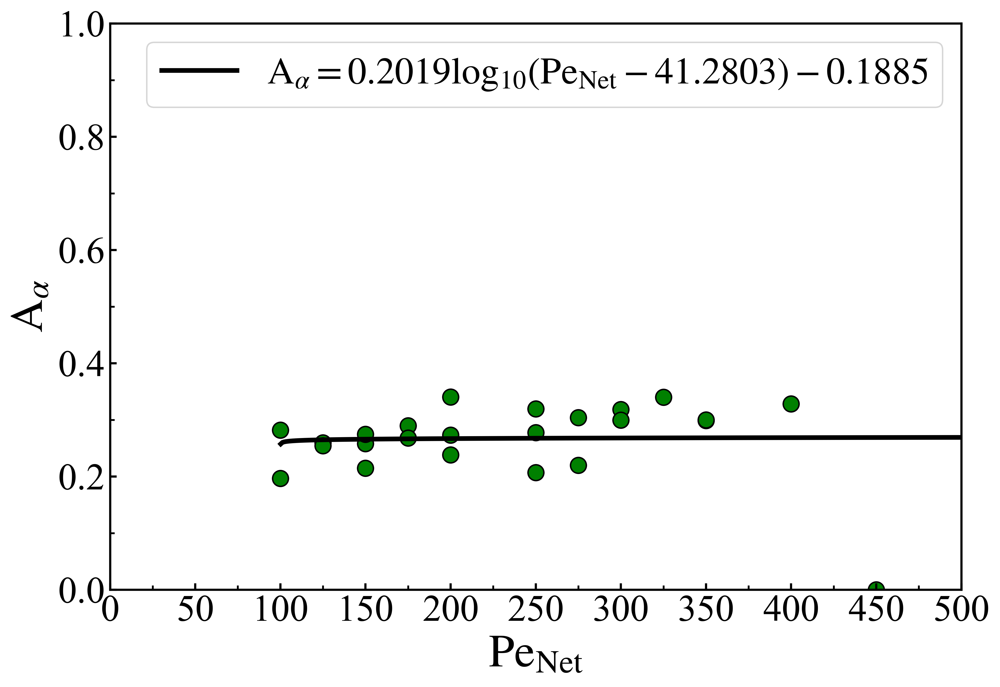

0.184060558169247
0.4580108028021697
207.84428865715614


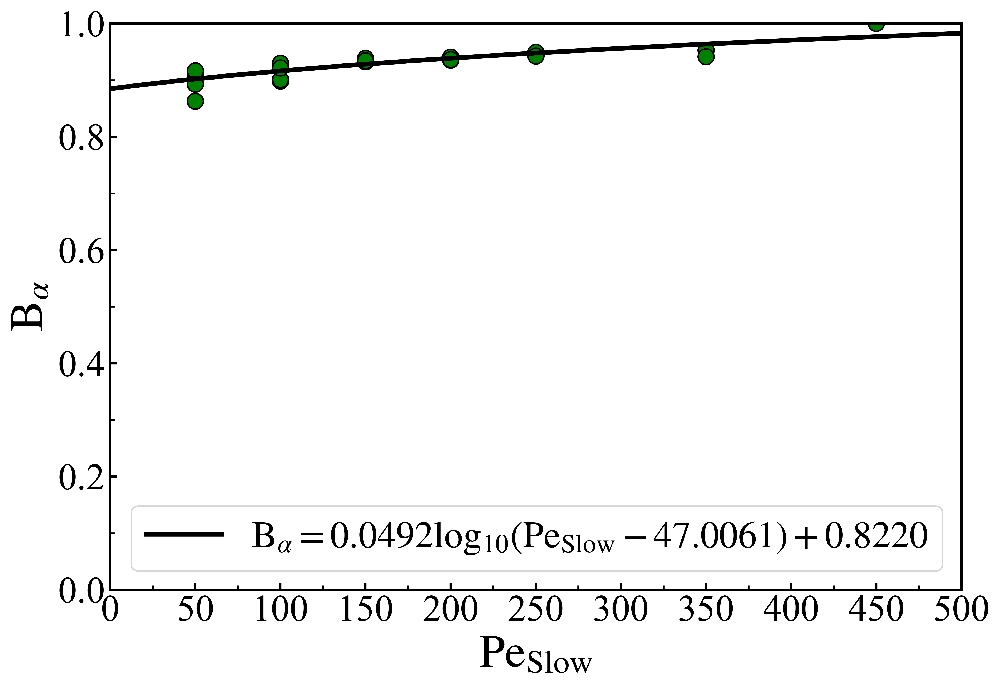

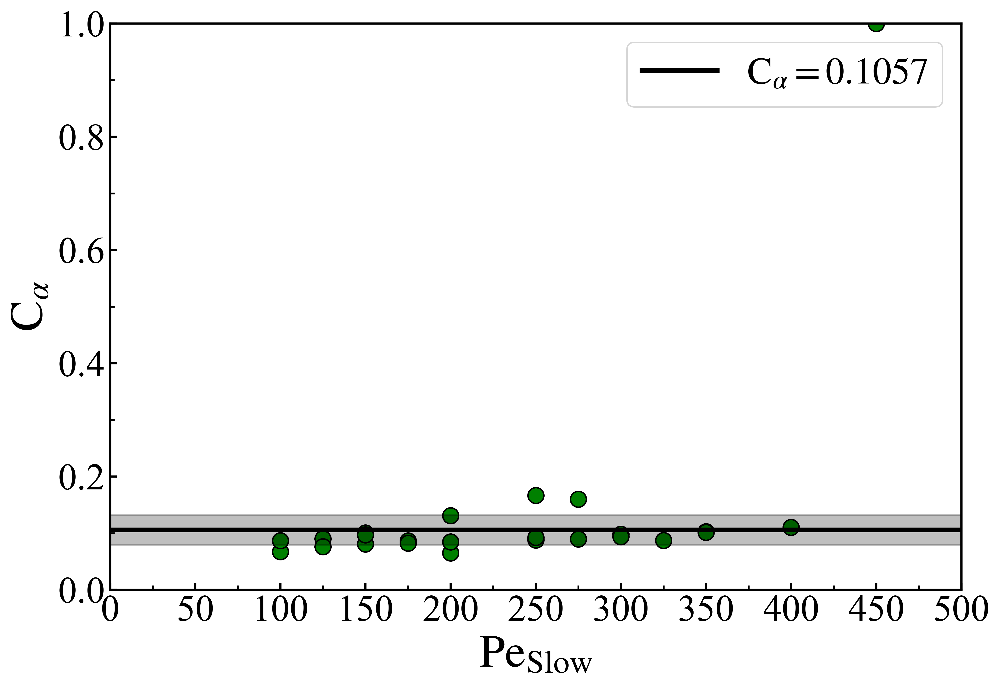

In [27]:
nonzero_c = np.where((np.abs(fitc_arr)>0.03) & (fitb_arr>0.8))[0]
print(np.mean(np.abs(fitc_arr[nonzero_c])))
print(np.mean(np.abs(fitb_arr[nonzero_c])))
print(np.mean(np.abs(fita_arr[nonzero_c])))

sumc=0
sumb=0
suma=0
for i in range(0, len(fitc_arr[nonzero_c])):
    sumc+=(np.abs(fitc_arr[nonzero_c][i])-np.mean(np.abs(fitc_arr[nonzero_c])))**2
    sumb+=(np.abs(fitb_arr[nonzero_c][i])-np.mean(np.abs(fitb_arr[nonzero_c])))**2
    suma+=(np.abs(fita_arr[nonzero_c][i])-np.mean(np.abs(fita_arr[nonzero_c])))**2
std_c = (sumc/len(fitc_arr[nonzero_c]))**0.5
std_b = (sumb/len(fitb_arr[nonzero_c]))**0.5
std_a = (suma/len(fita_arr[nonzero_c]))**0.5

print(std_c)
print(std_b)
print(std_a)
x_span = np.linspace(0, 500, num=500)

A=0.2019*np.log10(x_span-41.2803)-0.1885
B=0.0492*np.log10(x_span-47.0061)+0.8220
C=-0.0065*np.log10(x_span-50.0000)+0.1076

import matplotlib.patches as mpatches
from matplotlib import cm
import matplotlib.patches as patches

def Gauss2(x, A, B):
    y = A*x+B
    return y

def Gauss4(x, A, B, C):
    y = A*np.log10(x+C)+B
    return y

parameters, covariance = curve_fit(Gauss4, pe_net_arr[nonzero_c], fita_arr[nonzero_c])
#parameters2, covariance2 = curve_fit(Gauss, radius_arr_final, num_dens_arr_temp)

fit_A = parameters[0]
fit_B = parameters[1]
fit_C = parameters[2]
print(fit_A)
print(fit_B)
print(fit_C)
#fit_A2 = phi_theory#parameters2[0]
#fit_B2 = parameters2[1]
#fit_C2 = parameters2[2]

fit_y = Gauss4(radius_arr_final, fit_A, fit_B, fit_C)
                      
div_min = -3
min_n = 0
max_n = 20
levels_text=40
level_boundaries = np.linspace(min_n, max_n, levels_text + 1)
tick_locs   = [0.0,np.pi/6,np.pi/3]
tick_labels = ['0',r'$\pi/6$',r'$\pi/3$']

fig, ax1 = plt.subplots(figsize=(10,7))
ax1.scatter(pe_net_arr[nonzero_c], fita_arr[nonzero_c], linewidths=1.0, edgecolor='black', facecolor='green', s=120.0)
plt.plot(x_span, np.log10(x_span+fit_C)*fit_A + fit_B, color='black', linewidth=1.8*1.8, label=r'$\mathrm{A}_\alpha=0.2019\mathrm{log}_{10}(\mathrm{Pe}_\mathrm{Net}-41.2803)-0.1885$')      

yellow_patch = mpatches.Patch(color='yellow', label='Fast Interface')
red_patch = mpatches.Patch(color='green', label='Slow Bulk')
#plt.legend(handles=[yellow_patch, red_patch], fancybox=True, framealpha=0.75, ncol=1, fontsize=12, loc='upper left',labelspacing=0.1, handletextpad=0.1)
# Set all the x ticks for radial plots
loc = ticker.MultipleLocator(base=50)
ax1.xaxis.set_major_locator(loc)
loc = ticker.MultipleLocator(base=25)
ax1.xaxis.set_minor_locator(loc)
ax1.set_ylim([0,1.0])

props = dict(boxstyle='square', facecolor='white', edgecolor='none', alpha=0.85, pad=0.1)
plt.legend(loc='upper right', fontsize=26)
#ax1.text(0.68, 0.56, r'$y=\mathrm{A}_\alpha e^{-(x-\mathrm{B}_\alpha)^2/2 \mathrm{C}_\alpha^2}$', zorder=10,
#                                               transform=ax1.transAxes,
#                                               fontsize=28,fontdict={'fontname':'Helvetica'}, bbox=props)  

# Set y ticks
loc = ticker.MultipleLocator(base=0.2)
ax1.yaxis.set_major_locator(loc)
loc = ticker.MultipleLocator(base=0.1)
ax1.yaxis.set_minor_locator(loc)
ax1.set_xlim([0,500.0])

ax1.tick_params(axis='x', labelsize=26)
ax1.tick_params(axis='y', labelsize=26)
ax1.set_xlabel(r'$\mathrm{Pe}_\mathrm{Net}$', fontsize=32)
ax1.set_ylabel(r'$\mathrm{A}_\alpha$', fontsize=32)
plt.tight_layout()
plt.show()

parameters, covariance = curve_fit(Gauss4, pe_slow_arr[nonzero_c], fitb_arr[nonzero_c])
#parameters2, covariance2 = curve_fit(Gauss, radius_arr_final, num_dens_arr_temp)

fit_A = parameters[0]
fit_B = parameters[1]
fit_C = parameters[2]
print(fit_A)
print(fit_B)
print(fit_C)
#fit_A2 = phi_theory#parameters2[0]
#fit_B2 = parameters2[1]
#fit_C2 = parameters2[2]

fit_y = Gauss4(radius_arr_final, fit_A, fit_B, fit_C)

fig, ax1 = plt.subplots(figsize=(10,7))

ax1.scatter(pe_slow_arr[nonzero_c], fitb_arr[nonzero_c], linewidths=1.0, edgecolor='black', facecolor='green', s=120.0)
plt.plot(x_span, np.log10(x_span+fit_C)*fit_A + fit_B, color='black', linewidth=1.8*1.8, label=r'$\mathrm{B}_\alpha=0.0492\mathrm{log}_{10}(\mathrm{Pe}_\mathrm{Slow}-47.0061)+0.8220$')      

props = dict(boxstyle='square', facecolor='white', edgecolor='none', alpha=0.85, pad=0.1)
#ax1.text(0.68, 0.58, r'$\alpha(x)=\mathrm{A}_\alpha e^{-(x-\mathrm{B}_\alpha)^2/2\mathrm{C}_\alpha^2}$', zorder=10,
#                                               transform=ax1.transAxes,
#                                               fontsize=28,fontdict={'fontname':'Helvetica'}, bbox=props)  
#ax1.text(0.68, 0.5, r'$\mu_{\mathrm{B}_\alpha}=0.9236$', zorder=10,
#                                               transform=ax1.transAxes,
#                                               fontsize=28,fontdict={'fontname':'Helvetica'}, bbox=props)  
#ax1.text(0.68, 0.42, r'$\sigma_{\mathrm{B}_\alpha}=0.0153$', zorder=10,
#                                               transform=ax1.transAxes,
#                                               fontsize=28,fontdict={'fontname':'Helvetica'}, bbox=props)          
# Set all the x ticks for radial plots
loc = ticker.MultipleLocator(base=50)
ax1.xaxis.set_major_locator(loc)
loc = ticker.MultipleLocator(base=25)
ax1.xaxis.set_minor_locator(loc)


# Set y ticks
loc = ticker.MultipleLocator(base=0.2)
ax1.yaxis.set_major_locator(loc)
loc = ticker.MultipleLocator(base=0.1)
ax1.yaxis.set_minor_locator(loc)
    
ax1.tick_params(axis='x', labelsize=26)
ax1.tick_params(axis='y', labelsize=26)
ax1.set_xlabel(r'$\mathrm{Pe}_\mathrm{Slow}$', fontsize=32)
ax1.set_ylabel(r'$\mathrm{B}_\alpha$', fontsize=32)
ax1.set_ylim([0,1.0])
ax1.set_xlim([0,500.0])

plt.legend(loc='lower right', fontsize=26)

plt.tight_layout()
plt.show()

#parameters2, covariance2 = curve_fit(Gauss, radius_arr_final, num_dens_arr_temp)


#fit_A2 = phi_theory#parameters2[0]
#fit_B2 = parameters2[1]
#fit_C2 = parameters2[2]

#fit_y = Gauss4(radius_arr_final, fit_A, fit_B, fit_C)

fig, ax1 = plt.subplots(figsize=(10,7))

y_val = np.ones(len(x_span)) * 0.105704
y_err = np.ones(len(x_span)) * 0.028275
        
ax1.scatter(pe_net_arr[nonzero_c], np.abs(fitc_arr[nonzero_c]), linewidths=1.0, edgecolor='black', facecolor='green', s=120.0)
plt.plot(x_span, y_val, color='black', linewidth=1.8*1.8, label=r'$\mathrm{C}_\alpha=0.1057$')      
plt.axvspan(0, 500, ymin=0.105704-0.026628, ymax=0.105704+0.026628, color='black', alpha=0.25)
# Set all the x ticks for radial plots
loc = ticker.MultipleLocator(base=50)
ax1.xaxis.set_major_locator(loc)
loc = ticker.MultipleLocator(base=25)
ax1.xaxis.set_minor_locator(loc)
props = dict(boxstyle='square', facecolor='white', edgecolor='none', alpha=0.85, pad=0.1)
#ax1.text(0.68, 0.58, r'$\alpha(x)=\mathrm{A}_\alpha e^{-(x-\mathrm{B}_\alpha)^2/2 \mathrm{C}_\alpha^2}$', zorder=10,
#                                               transform=ax1.transAxes,
#                                               fontsize=28,fontdict={'fontname':'Helvetica'}, bbox=props)  
# Set y ticks
loc = ticker.MultipleLocator(base=0.2)
ax1.yaxis.set_major_locator(loc)
loc = ticker.MultipleLocator(base=0.1)
ax1.yaxis.set_minor_locator(loc)
                                    
    
ax1.tick_params(axis='x', labelsize=26)
ax1.tick_params(axis='y', labelsize=26)
ax1.set_xlabel(r'$\mathrm{Pe}_\mathrm{Slow}$', fontsize=32)
ax1.set_ylabel(r'$\mathrm{C}_\alpha$', fontsize=32)
ax1.set_ylim([0,1.0])
ax1.set_xlim([0,500.0])
plt.legend(loc='upper right', fontsize=26)

plt.tight_layout()
plt.show()

100
450


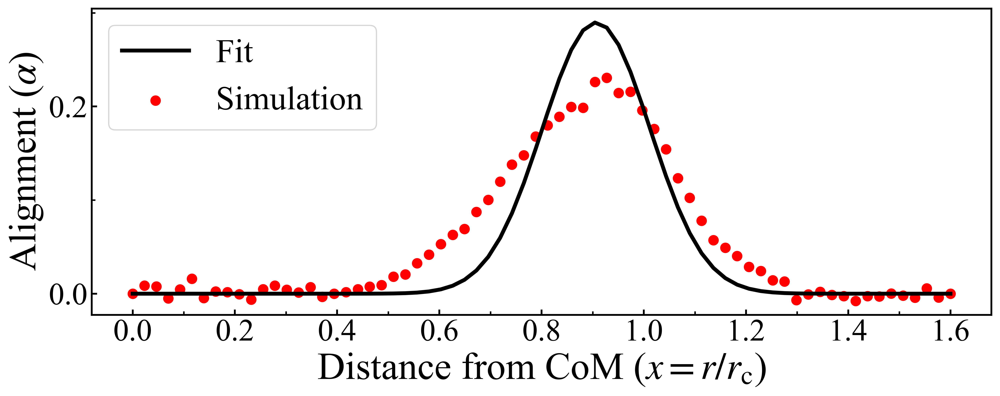

100
200


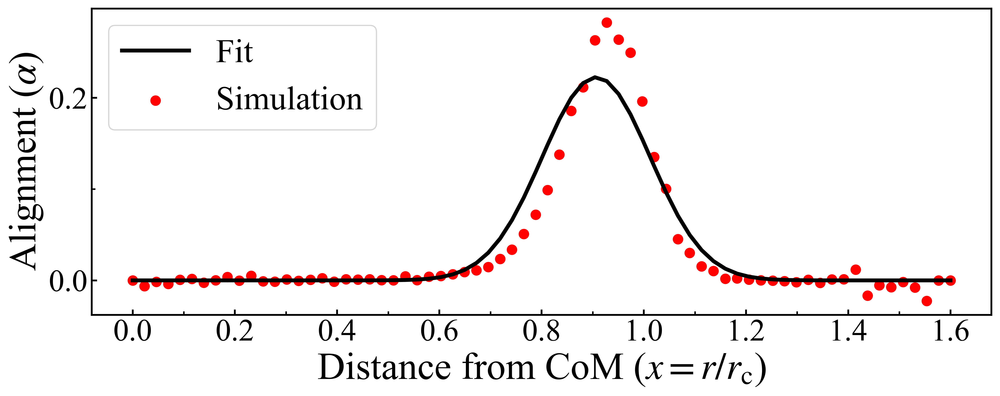

100
250


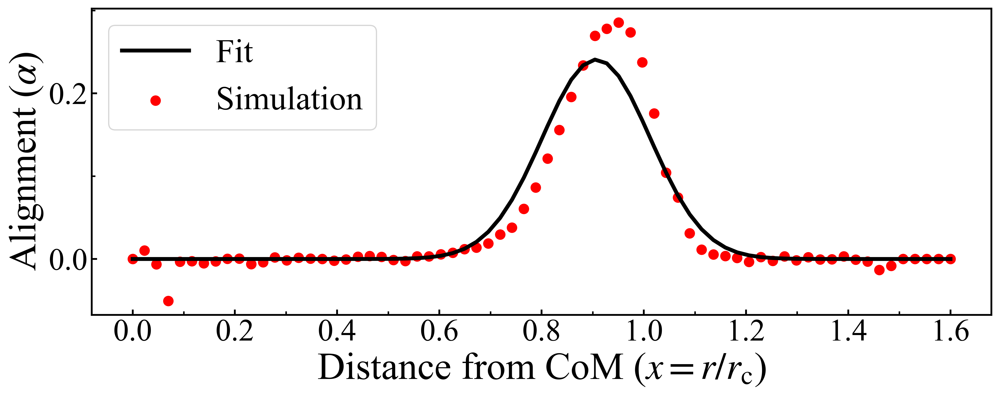

100
100


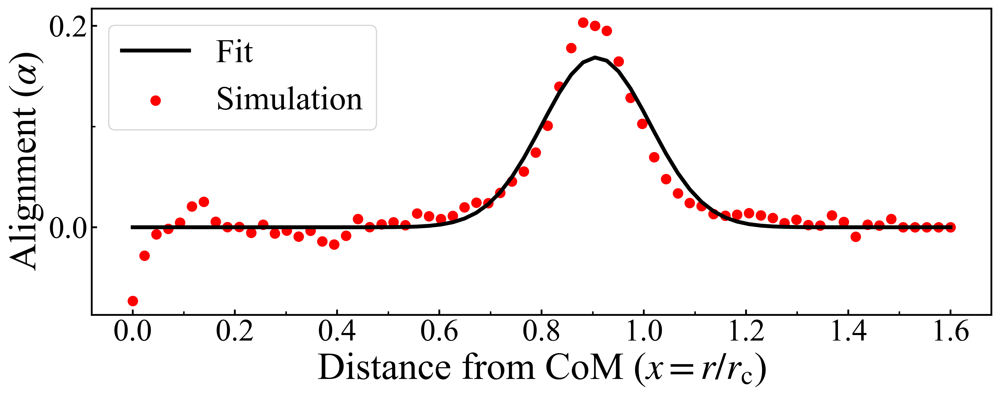

100
150


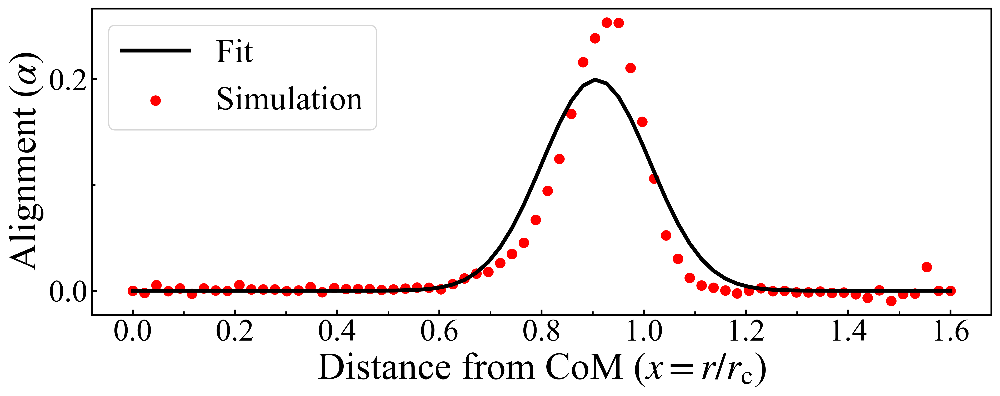

150
350


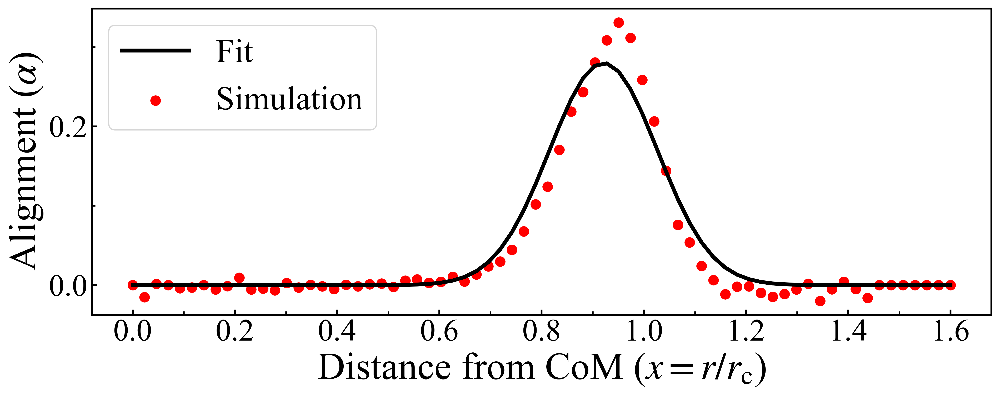

150
200


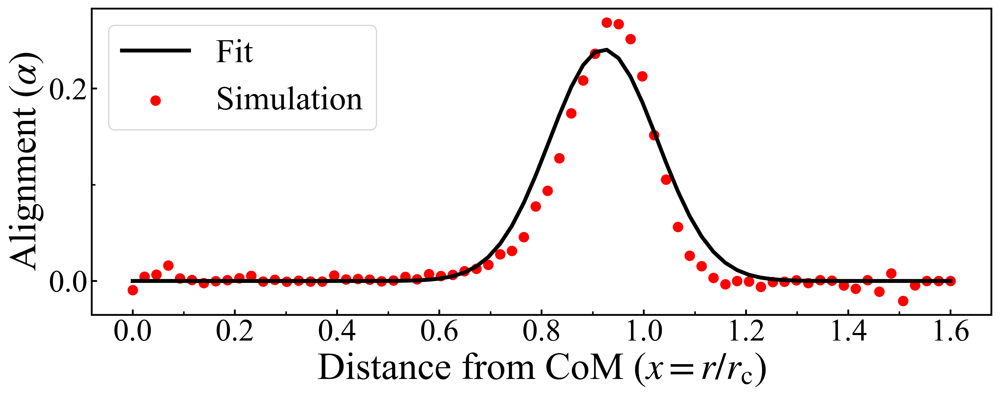

150
450


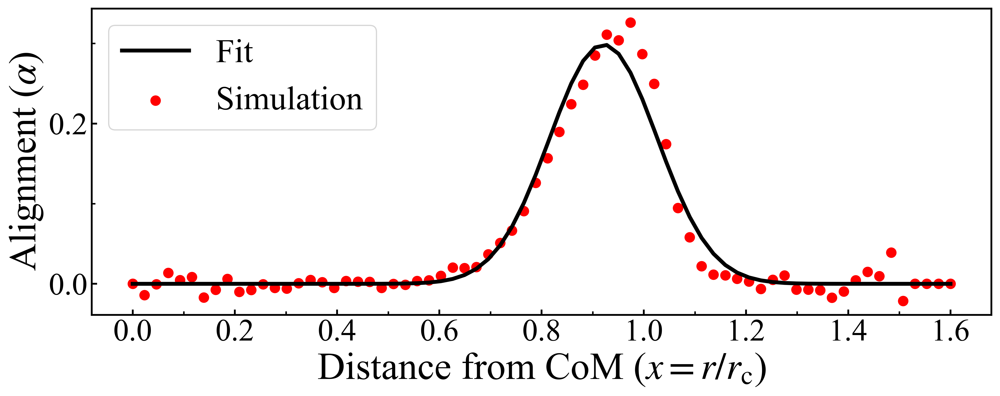

150
250


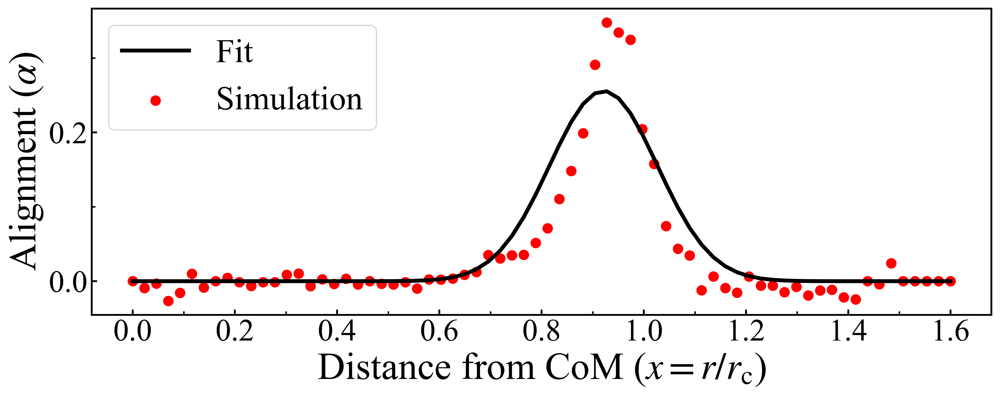

150
150


KeyboardInterrupt: 

In [28]:
align_peA=np.array([])
align_peB=np.array([])
align_peNet=np.array([])
align_xA=np.array([])
align_eps=np.array([])
align_pnum=np.array([])
align_phi=np.array([])
align_press_arr = np.array([])

radius_arr_final = np.linspace(0,1.6,num=70)
num_dens_arr_final = np.zeros(70)
align_arr_final = np.zeros(70)
press_arr_final = np.zeros(70)
final_count = np.zeros(70)
final_count_count = np.zeros(70)
align_max_arr = np.zeros(len(all_dens))
fita_arr = np.zeros(len(all_dens))
fitb_arr = np.zeros(len(all_dens))
fitc_arr = np.zeros(len(all_dens))
def getLat(peNet, eps):
    '''Get the lattice spacing for any pe'''
    if peNet == 0:
        return 2.**(1./6.)
    out = []
    r = 1.112
    skip = [0.1, 0.01, 0.001, 0.0001, 0.00001, 0.000001, 0.0000001, 0.00000001]
    for j in skip:
        while ljForce(r, eps) < avgCollisionForce(peNet):
            r -= j
        r += j
    return r  


from scipy.optimize import curve_fit
from scipy.stats import norm


pe_net_arr = np.zeros(len(all_dens))
pe_slow_arr = np.zeros(len(all_dens))
pe_fast_arr = np.zeros(len(all_dens))
for i in range(0, len(all_dens)):
    for l in range(0, len(all_pres_new)):
        if params['peA'][i]>50:
            if params['peB'][i]>50:
                if params3['peA'][l]==params['peA'][i]:
                    if params3['peB'][l]==params['peB'][i]:
                        if params3['eps'][l]==params['eps'][i]:
                            if params3['phi'][l]==params['phi'][i]:
                                if params3['xA'][l]==params['xA'][i]:
                                    print(params['peA'][i])
                                    print(params['peB'][i])
                                    num_dens_arr_temp = np.zeros(70)
                                    align_arr_temp = np.zeros(70)
                                    press_arr_temp = np.zeros(70)
                                    temp_count = np.zeros(70)
                                    temp_count_count = np.zeros(70)
                                    align_max_arr[i] = np.max(align_arr)
                                    pe_net_arr[i] = (params['peA'][i]*params['xA'][i]/100) + params['peB'][i] * ( 1.0-params['xA'][i]/100)
                                    pe_slow_arr[i] = (params['peA'][i])
                                    pe_fast_arr[i] = (params['peB'][i])
                                    # Don't plot non-phase-separated data
                                    if all_dens[i].empty:
                                            continue
                                    time_arr = np.array([])


                                    max_size = np.amax(all_dens[i]['clust_size'])
                                    for j in range(0, len(all_dens[i]['clust_size'])):
                                        
                                        time = all_dens[i]['tauB'][j]
                                        time_id = np.where(all_dens[i]['tauB']==time)[0]
                                        time_id2 = np.where(all_pres_new[l]['tauB']==time)[0]
                                        if len(time_id2)>0:
                                            if len(time_id2)==1:
                                                edge_width = all_pres_new[l]['radius'][time_id2[0]]
                                                nB = all_pres_new[l]['Nb'][time_id2[0]]
                                                nA = all_pres_new[l]['Na'][time_id2[0]]
                                            elif len(time_id2)>1:
                                                edge_width = np.max(all_pres_new[l]['radius'][time_id2])
                                                nB = np.max(all_pres_new[l]['Nb'][time_id2])
                                                nA = np.max(all_pres_new[l]['Na'][time_id2])
                                                if time not in time_arr:
                                                    time_arr = np.append(time_arr, time)  
                                                    if len(time_arr)>=2:
                                                        if np.max(radius_arr)<edge_width:
                                                            for k in range(0, len(radius_arr_final)-1):
                                                                rad_where = np.where((radius_arr_final[k]<=radius_arr) & (radius_arr<radius_arr_final[k+1]))[0]
                                                                if len(rad_where)>0:
                                                                    nonzero_align = np.where(align_arr[rad_where]!=0)[0]
                                                                    if len(nonzero_align)>0:
                                                                        press_arr_final[k]+=np.mean(press_arr[rad_where][nonzero_align])
                                                                        align_arr_final[k]+=np.mean(align_arr[rad_where][nonzero_align])
                                                                        num_dens_arr_final[k]+=np.mean(num_dens_arr[rad_where][nonzero_align])
                                                                        final_count[k]+=1
                                                                        final_count_count[k]+=len(rad_where)
                                                                        
                                                                        press_arr_temp[k]+=np.mean(press_arr[rad_where][nonzero_align])
                                                                        align_arr_temp[k]+=np.mean(align_arr[rad_where][nonzero_align])
                                                                        num_dens_arr_temp[k]+=np.mean(num_dens_arr[rad_where][nonzero_align])
                                                                        temp_count[k]+=1
                                                                        temp_count_count[k]+=len(rad_where)
                                                                        
                                                    radius_arr = np.array([])
                                                    align_arr = np.array([])
                                                    num_dens_arr = np.array([])
                                                    press_arr = np.array([])
                                                    radius_arr = np.append(radius_arr, all_dens[i]['r_max'][j]/edge_width)   
                                                    align_arr = np.append(align_arr, all_dens[i]['align'][j])   
                                                    num_dens_arr = np.append(num_dens_arr, all_dens[i]['num_dens'][j])   
                                                    press_arr = np.append(press_arr, all_dens[i]['press'][j])   
                                                else:
                                                    radius_arr = np.append(radius_arr, all_dens[i]['r_max'][j]/edge_width)   
                                                    align_arr = np.append(align_arr, all_dens[i]['align'][j])   
                                                    num_dens_arr = np.append(num_dens_arr, all_dens[i]['num_dens'][j])   
                                                    press_arr = np.append(press_arr, all_dens[i]['press'][j]) 

                                    
                                    for q in range(0, len(align_arr_temp)):
                                        if temp_count[q]>0:
                                            align_arr_temp[q]=align_arr_temp[q]/temp_count[q]
                                            num_dens_arr_temp[q]=align_arr_temp[q]/temp_count[q]
                                            #align_arr_temp[q]=align_arr_temp[q]/temp_count[q]
                                    latNet = getLat(pe_net_arr[i], 1.0)
                                    phi_theory = latToPhi(latNet) / (np.pi/4)
                                    A=0.2019*np.log10(pe_net_arr[i]-41.2803)-0.1885
                                    B=0.0492*np.log10(pe_slow_arr[i]-47.0061)+0.8220
                                    C=0.1057
                                    #y = np.zeros(len(x))
                                    #for q in range(0, len(x)):
                                    y = A*np.exp(-(radius_arr_final-B)**2/(2*C**2))
                                    '''
                                    fig, ax1 = plt.subplots(figsize=(12,5))
                                    #plt.plot(radius_arr_final, align_arr_temp, 'o', label='Data')
                                    x_start = np.array([0, 0.79999999, 0.8, 1.0, 1.00000000001, 1.2])
                                    align_start = np.array([0, 0, 1, 1, 0, 0])
                                    dens_start = np.array([1, 1, 1, 1, 0, 0])

                                    plt.plot(x_start, align_start, '-', color='black', lw=1.8*1.8, label='Initial')
                                    #plt.plot(radius_arr_final, y, '-', color='blue', label='Steady State',lw=1.8*1.8)
                                    # Set all the x ticks for radial plots
                                    loc = ticker.MultipleLocator(base=0.2)
                                    ax1.xaxis.set_major_locator(loc)
                                    loc = ticker.MultipleLocator(base=0.1)
                                    ax1.xaxis.set_minor_locator(loc)
                                   # Set y ticks
                                    loc = ticker.MultipleLocator(base=0.2)
                                    ax1.yaxis.set_major_locator(loc)
                                    loc = ticker.MultipleLocator(base=0.1)
                                    ax1.yaxis.set_minor_locator(loc)
    

                                    ax1.tick_params(axis='x', labelsize=24)
                                    ax1.tick_params(axis='y', labelsize=24)
                                    ax1.set_xlabel(r'Distance from CoM ($r/r_\mathrm{c}$)', fontsize=30)
                                    ax1.set_ylabel(r'Alignment ($\alpha$)', fontsize=30)
                                    ax1.set_ylim([-0.05,1.05])
                                    ax1.set_xlim([0, 1.2])
                                    plt.legend(loc='upper left')
                                    plt.tight_layout()
                                    plt.show()
                                    
                                    fig, ax1 = plt.subplots(figsize=(12,5))
                                    #plt.plot(radius_arr_final, align_arr_temp, 'o', label='Data')
                                    plt.plot(radius_arr_final, y, '-', label='Theory',lw=1.8*1.8)
                                    # Set all the x ticks for radial plots
                                    loc = ticker.MultipleLocator(base=0.2)
                                    ax1.xaxis.set_major_locator(loc)
                                    loc = ticker.MultipleLocator(base=0.1)
                                    ax1.xaxis.set_minor_locator(loc)
                                   # Set y ticks
                                    loc = ticker.MultipleLocator(base=0.2)
                                    ax1.yaxis.set_major_locator(loc)
                                    loc = ticker.MultipleLocator(base=0.1)
                                    ax1.yaxis.set_minor_locator(loc)


                                    ax1.tick_params(axis='x', labelsize=24)
                                    ax1.tick_params(axis='y', labelsize=24)
                                    ax1.set_xlabel(r'$r$', fontsize=30)
                                    ax1.set_ylabel(r'$n$', fontsize=30)
                                    ax1.set_ylim([-0.05,1.05])
                                    #plt.legend(loc='upper left')
                                    plt.tight_layout()
                                    plt.show()
                                    '''
                                    fig, ax1 = plt.subplots(figsize=(12,5))
                                    plt.scatter(radius_arr_final, align_arr_temp, marker='o', color='red', s=60, label='Simulation')
                                    plt.plot(radius_arr_final, y, '-', color='black', label='Fit',lw=1.8*1.8)
                                    # Set all the x ticks for radial plots
                                    loc = ticker.MultipleLocator(base=0.2)
                                    ax1.xaxis.set_major_locator(loc)
                                    loc = ticker.MultipleLocator(base=0.1)
                                    ax1.xaxis.set_minor_locator(loc)
                                   # Set y ticks
                                    loc = ticker.MultipleLocator(base=0.2)
                                    ax1.yaxis.set_major_locator(loc)
                                    loc = ticker.MultipleLocator(base=0.1)
                                    ax1.yaxis.set_minor_locator(loc)


                                    ax1.tick_params(axis='x', labelsize=26)
                                    ax1.tick_params(axis='y', labelsize=26)
                                    ax1.set_xlabel(r'Distance from CoM ($x=r/r_\mathrm{c}$)', fontsize=32)
                                    ax1.set_ylabel(r'Alignment ($\alpha$)', fontsize=32)
                                    #ax1.set_ylim([-0.05,1.05])
                                    props = dict(boxstyle='square', facecolor='white', edgecolor='none', alpha=0.85, pad=0.1)
                                    #ax1.text(0.44, 0.88, r'$y=(0.00047\mathrm{Pe}_\mathrm{Net}+0.165)e^{-(x-0.925)^2/(2\times0.093^2)}$', zorder=10,
                                    #           transform=ax1.transAxes,
                                    #           fontsize=22,fontdict={'fontname':'Helvetica'}, bbox=props)  
                                    plt.legend(loc='upper left', fontsize=28)
                                    plt.tight_layout()
                                    plt.show()

                                    #plt.plot(radius_arr_done, num_dens_arr_done, 'o', label='data')
                                    #plt.plot(radius_arr_done, fit_y2, '-', label='fit')
                                    #plt.legend()
                                    #plt.show()

                                    #plt.scatter(radius_arr_done, align_arr_done, c='green')
                                    #plt.show()

                                    #plt.scatter(radius_arr_done, num_dens_arr_done, c='red')
                                    #plt.show()

                                    #plt.scatter(radius_arr_final, final_count_count, c='blue')
                                    #plt.show()

press_arr_done = np.array([])
align_arr_done = np.array([])
num_dens_arr_done = np.array([])
radius_arr_done = np.array([])
align_arr_final[0:5]=0
press_arr_final[0:5]=0
for i in range(0, len(press_arr_final)):
    if final_count[i]>0:
            press_arr_done = np.append(press_arr_done, press_arr_final[i]/final_count[i])
            align_arr_done = np.append(align_arr_done, align_arr_final[i]/final_count[i])
            if (i<len(press_arr_final)-3) & (i>=2):
                num_dens_arr_done = np.append(num_dens_arr_done, np.sum(num_dens_arr_final[i-2:i+3])/np.sum(final_count[i-2:i+3]))
            else:
                num_dens_arr_done = np.append(num_dens_arr_done, num_dens_arr_final[i]/final_count[i])

            radius_arr_done = np.append(radius_arr_done, radius_arr_final[i])
plt.plot(radius_arr_done, num_dens_arr_done)
plt.show()
plt.plot(radius_arr_done, align_arr_done)
plt.show()
plt.plot(radius_arr_done, press_arr_done)
plt.show()

100
450


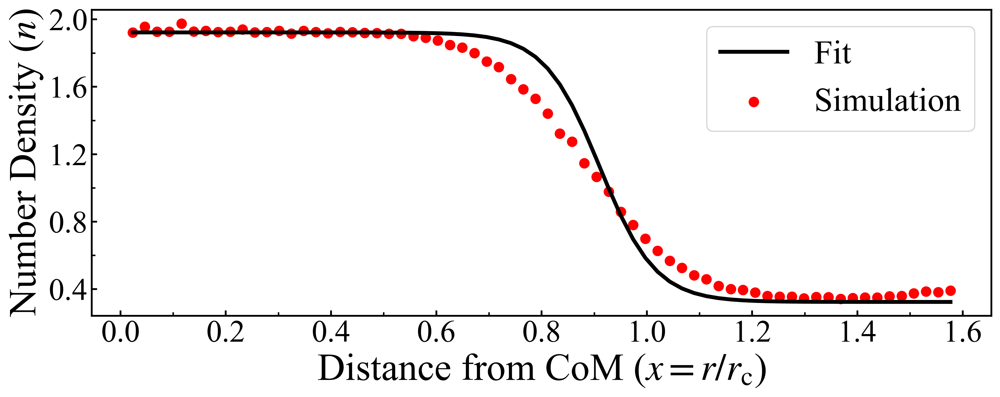

100
200


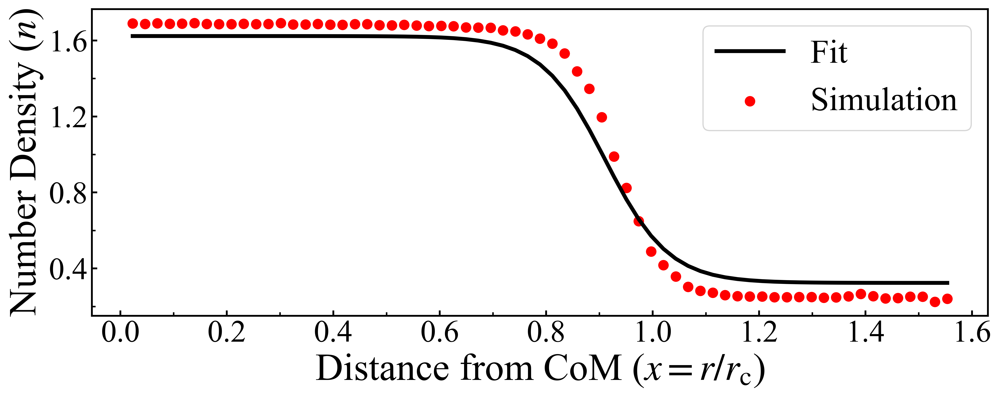

100
250


KeyboardInterrupt: 

In [30]:
align_peA=np.array([])
align_peB=np.array([])
align_peNet=np.array([])
align_xA=np.array([])
align_eps=np.array([])
align_pnum=np.array([])
align_phi=np.array([])
align_press_arr = np.array([])

radius_arr_final = np.linspace(0,1.6,num=70)
num_dens_arr_final = np.zeros(70)
align_arr_final = np.zeros(70)
press_arr_final = np.zeros(70)
final_count = np.zeros(70)
final_count_count = np.zeros(70)
align_max_arr = np.zeros(len(all_dens))
fita_arr = np.zeros(len(all_dens))
fitb_arr = np.zeros(len(all_dens))
fitc_arr = np.zeros(len(all_dens))
def getLat(peNet, eps):
    '''Get the lattice spacing for any pe'''
    if peNet == 0:
        return 2.**(1./6.)
    out = []
    r = 1.112
    skip = [0.1, 0.01, 0.001, 0.0001, 0.00001, 0.000001, 0.0000001, 0.00000001]
    for j in skip:
        while ljForce(r, eps) < avgCollisionForce(peNet):
            r -= j
        r += j
    return r  


from scipy.optimize import curve_fit
from scipy.stats import norm


pe_net_arr = np.zeros(len(all_dens))
for i in range(0, len(all_dens)):
    for l in range(0, len(all_pres_new)):
        if params['peA'][i]>50:
            if params['peB'][i]>50:
                if params3['peA'][l]==params['peA'][i]:
                    if params3['peB'][l]==params['peB'][i]:
                        if params3['eps'][l]==params['eps'][i]:
                            if params3['phi'][l]==params['phi'][i]:
                                if params3['xA'][l]==params['xA'][i]:
                                    print(params['peA'][i])
                                    print(params['peB'][i])
                                    num_dens_arr_temp = np.zeros(70)
                                    align_arr_temp = np.zeros(70)
                                    press_arr_temp = np.zeros(70)
                                    temp_count = np.zeros(70)
                                    temp_count_count = np.zeros(70)
                                    align_max_arr[i] = np.max(align_arr)
                                    pe_net_arr[i] = (params['peA'][i]*params['xA'][i]/100) + params['peB'][i] * ( 1.0-params['xA'][i]/100)
                                    pe_slow_arr[i] = (params['peA'][i])
                                    pe_fast_arr[i] = (params['peB'][i])
                                    # Don't plot non-phase-separated data
                                    if all_dens[i].empty:
                                            continue
                                    time_arr = np.array([])


                                    max_size = np.amax(all_dens[i]['clust_size'])
                                    rat_edge_arr = 0
                                    rat_edge_val = 0
                                    
                                    for j in range(0, len(all_dens[i]['clust_size'])):
                                        
                                        time = all_dens[i]['tauB'][j]
                                        time_id = np.where(all_dens[i]['tauB']==time)[0]
                                        time_id2 = np.where(all_pres_new[l]['tauB']==time)[0]
                                        if len(time_id2)>0:
                                            if len(time_id2)==1:
                                                edge_width = all_pres_new[l]['radius'][time_id2[0]]
                                                nB = all_pres_new[l]['Nb'][time_id2[0]]
                                                nA = all_pres_new[l]['Na'][time_id2[0]]
                                            elif len(time_id2)>1:
                                                edge_width = np.max(all_pres_new[l]['radius'][time_id2])
                                                nB = np.max(all_pres_new[l]['Nb'][time_id2])
                                                nA = np.max(all_pres_new[l]['Na'][time_id2])
                                                if time not in time_arr:
                                                    time_arr = np.append(time_arr, time)  
                                                    if len(time_arr)>=2:
                                                        if np.max(radius_arr)<edge_width:
                                                            for k in range(0, len(radius_arr_final)-1):
                                                                rad_where = np.where((radius_arr_final[k]<=radius_arr) & (radius_arr<radius_arr_final[k+1]))[0]
                                                                if len(rad_where)>0:
                                                                    nonzero_align = np.where(align_arr[rad_where]!=0)[0]
                                                                    if len(nonzero_align)>0:
                                                                        press_arr_final[k]+=np.mean(press_arr[rad_where][nonzero_align])
                                                                        align_arr_final[k]+=np.mean(align_arr[rad_where][nonzero_align])
                                                                        num_dens_arr_final[k]+=np.mean(num_dens_arr[rad_where][nonzero_align])
                                                                        final_count[k]+=1
                                                                        final_count_count[k]+=len(rad_where)
                                                                        
                                                                        press_arr_temp[k]+=np.mean(press_arr[rad_where][nonzero_align])
                                                                        align_arr_temp[k]+=np.mean(align_arr[rad_where][nonzero_align])
                                                                        num_dens_arr_temp[k]+=np.mean(num_dens_arr[rad_where][nonzero_align])
                                                                        temp_count[k]+=1
                                                                        temp_count_count[k]+=len(rad_where)
                                                                        
                                                    radius_arr = np.array([])
                                                    align_arr = np.array([])
                                                    num_dens_arr = np.array([])
                                                    press_arr = np.array([])
                                                    radius_arr = np.append(radius_arr, all_dens[i]['r_max'][j]/edge_width)   
                                                    align_arr = np.append(align_arr, all_dens[i]['align'][j])   
                                                    num_dens_arr = np.append(num_dens_arr, all_dens[i]['num_dens'][j])   
                                                    press_arr = np.append(press_arr, all_dens[i]['press'][j])   
                                                else:
                                                    radius_arr = np.append(radius_arr, all_dens[i]['r_max'][j]/edge_width)   
                                                    align_arr = np.append(align_arr, all_dens[i]['align'][j])   
                                                    num_dens_arr = np.append(num_dens_arr, all_dens[i]['num_dens'][j])   
                                                    press_arr = np.append(press_arr, all_dens[i]['press'][j]) 

                                    
                                    for q in range(0, len(align_arr_temp)):
                                        if temp_count[q]>0:
                                            align_arr_temp[q]=align_arr_temp[q]/temp_count[q]
                                            num_dens_arr_temp[q]=num_dens_arr_temp[q]/temp_count[q]
                                            #align_arr_temp[q]=align_arr_temp[q]/temp_count[q]
                                    latNet = getLat(pe_net_arr[i], 1.0)
                                    phi_theory = latToPhi(latNet) / (np.pi/4)
                                    phi_g_theory = compPhiG(pe_net_arr[i], latNet)
                                    rad_max = np.where(num_dens_arr_temp!=0)[0]
                                    #A=0.00048*pe_net_arr[i]+0.1648
                                    #y = np.zeros(len(x))
                                    #for q in range(0, len(x)):
                                    A=0.865659*np.log10(pe_net_arr[i]-46.992486)-0.442903
                                    #A=phi_theory - phi_g_theory
                                    B=-6.150813*np.log10(pe_net_arr[i]-49.921377)-4.391976
                                    C=0.043935*np.log10(pe_slow_arr[i]-49.892980)+0.835921
                                    #D=phi_g_theory
                                    D=-0.259766*np.log10(pe_slow_arr[i]-41.741660)+0.782493

                                    y = A/(1+np.exp(-B*(radius_arr_final[rad_max]-C)))+D
                                    
                                    fig, ax1 = plt.subplots(figsize=(12,5))
                                    plt.scatter(radius_arr_final[rad_max], num_dens_arr_temp[rad_max], marker='o', color='red', s=60, label='Simulation')
                                    plt.plot(radius_arr_final[rad_max], y, '-', color='black', label='Fit',lw=1.8*1.8)
                                    # Set all the x ticks for radial plots
                                    loc = ticker.MultipleLocator(base=0.2)
                                    ax1.xaxis.set_major_locator(loc)
                                    loc = ticker.MultipleLocator(base=0.1)
                                    ax1.xaxis.set_minor_locator(loc)
                                   # Set y ticks
                                    loc = ticker.MultipleLocator(base=0.4)
                                    ax1.yaxis.set_major_locator(loc)
                                    loc = ticker.MultipleLocator(base=0.2)
                                    ax1.yaxis.set_minor_locator(loc)


                                    ax1.tick_params(axis='x', labelsize=26)
                                    ax1.tick_params(axis='y', labelsize=26)
                                    ax1.set_xlabel(r'Distance from CoM ($x=r/r_\mathrm{c}$)', fontsize=32)
                                    ax1.set_ylabel(r'Number Density ($n$)', fontsize=32)
                                    #ax1.set_ylim([-0.05,1.05])
                                    props = dict(boxstyle='square', facecolor='white', edgecolor='none', alpha=0.85, pad=0.1)
                                    #ax1.text(0.44, 0.88, r'$n(x)=(0.0023\mathrm{Pe}_\mathrm{Net}+1.0194)/(1+e^{18.8699(x-0.92902)})+(-0.000683\mathrm{Pe}_\mathrm{Net}+0.3534)$', zorder=10,
                                    #           transform=ax1.transAxes,
                                    #           fontsize=22,fontdict={'fontname':'Helvetica'}, bbox=props)  
                                    plt.legend(loc='upper right', fontsize=28)
                                    plt.tight_layout()
                                    plt.show()

                                    #plt.plot(radius_arr_done, num_dens_arr_done, 'o', label='data')
                                    #plt.plot(radius_arr_done, fit_y2, '-', label='fit')
                                    #plt.legend()
                                    #plt.show()

                                    #plt.scatter(radius_arr_done, align_arr_done, c='green')
                                    #plt.show()

                                    #plt.scatter(radius_arr_done, num_dens_arr_done, c='red')
                                    #plt.show()

                                    #plt.scatter(radius_arr_final, final_count_count, c='blue')
                                    #plt.show()

press_arr_done = np.array([])
align_arr_done = np.array([])
num_dens_arr_done = np.array([])
radius_arr_done = np.array([])
align_arr_final[0:5]=0
press_arr_final[0:5]=0
for i in range(0, len(press_arr_final)):
    if final_count[i]>0:
            press_arr_done = np.append(press_arr_done, press_arr_final[i]/final_count[i])
            align_arr_done = np.append(align_arr_done, align_arr_final[i]/final_count[i])
            if (i<len(press_arr_final)-3) & (i>=2):
                num_dens_arr_done = np.append(num_dens_arr_done, np.sum(num_dens_arr_final[i-2:i+3])/np.sum(final_count[i-2:i+3]))
            else:
                num_dens_arr_done = np.append(num_dens_arr_done, num_dens_arr_final[i]/final_count[i])

            radius_arr_done = np.append(radius_arr_done, radius_arr_final[i])
plt.plot(radius_arr_done, num_dens_arr_done)
plt.show()
plt.plot(radius_arr_done, align_arr_done)
plt.show()
plt.plot(radius_arr_done, press_arr_done)
plt.show()

50
450
147.70115382700436


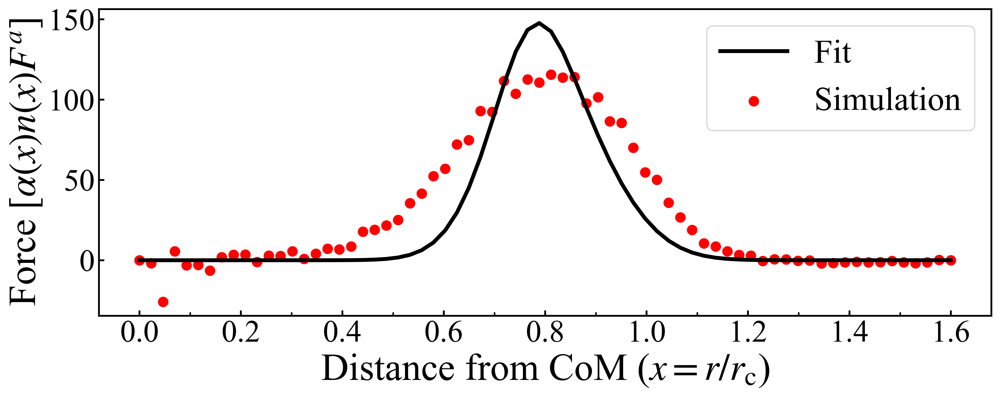

50
200
40.23282130797629


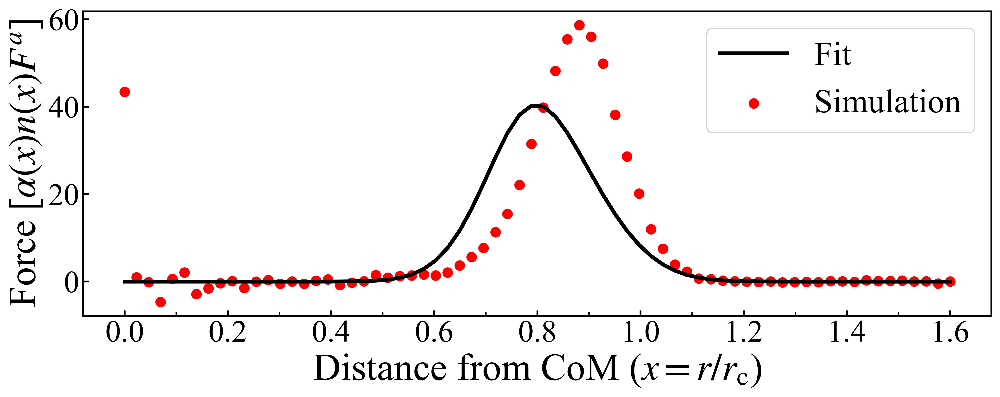

50
250
58.730965205289536


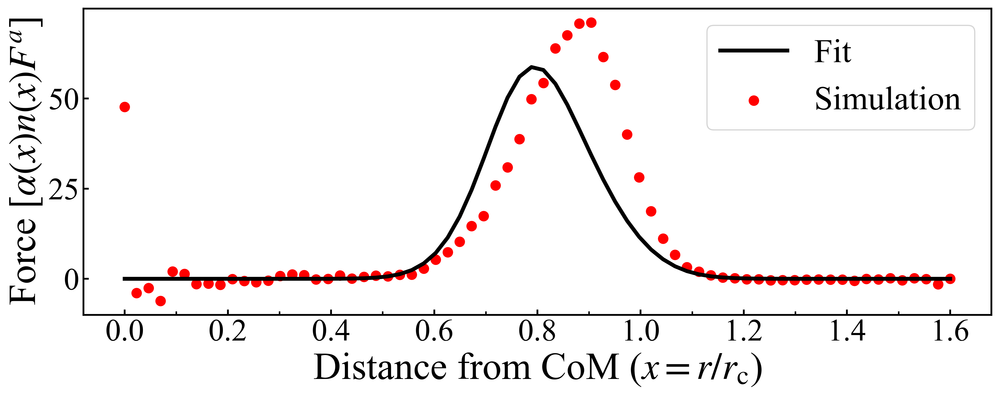

50
150
23.988174390638076


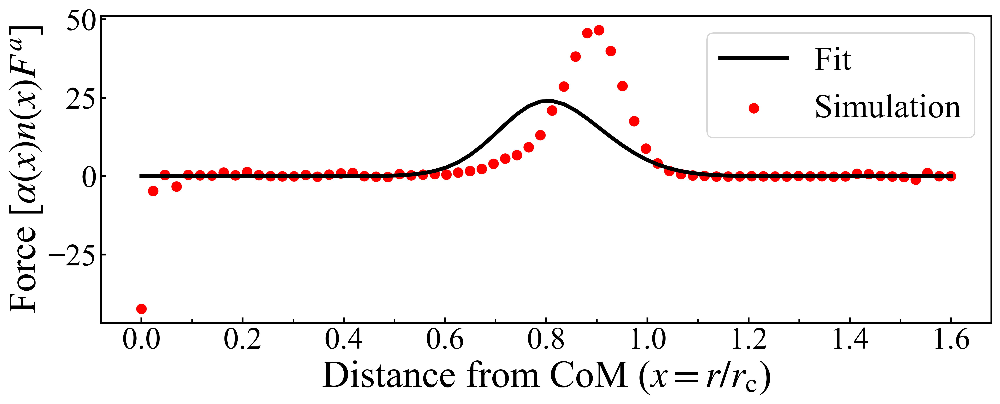

50
350
100.6156130766396


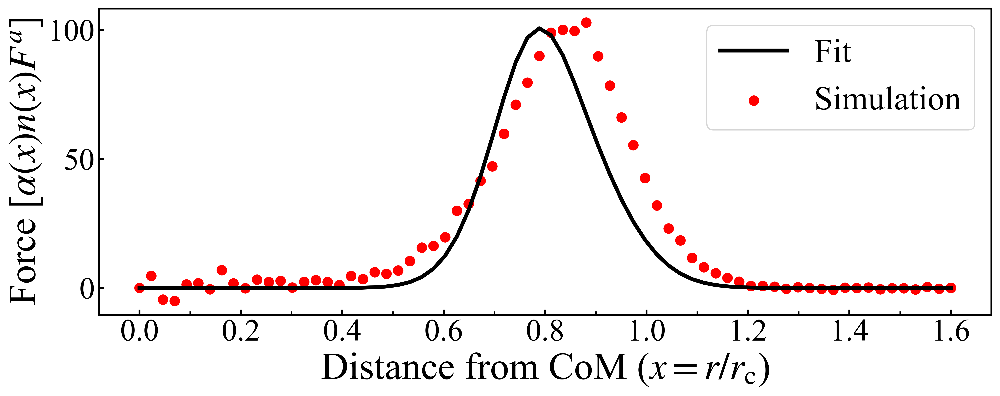

100
450
174.5915666657619


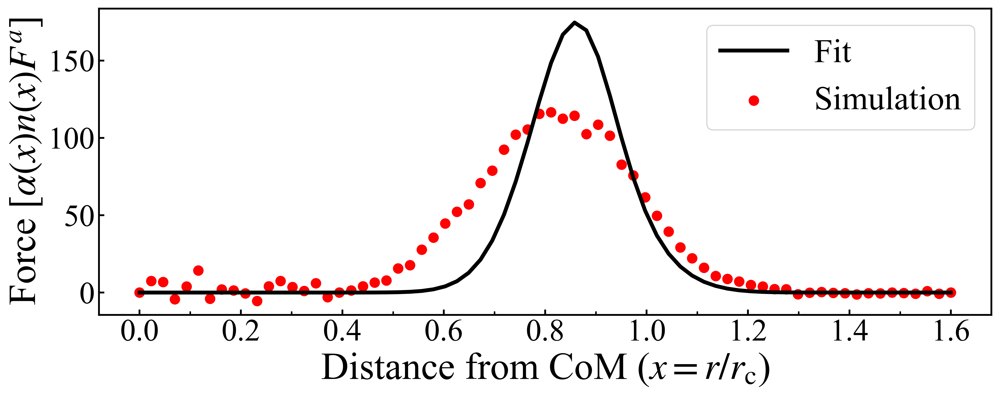

100
200
49.70315164128858


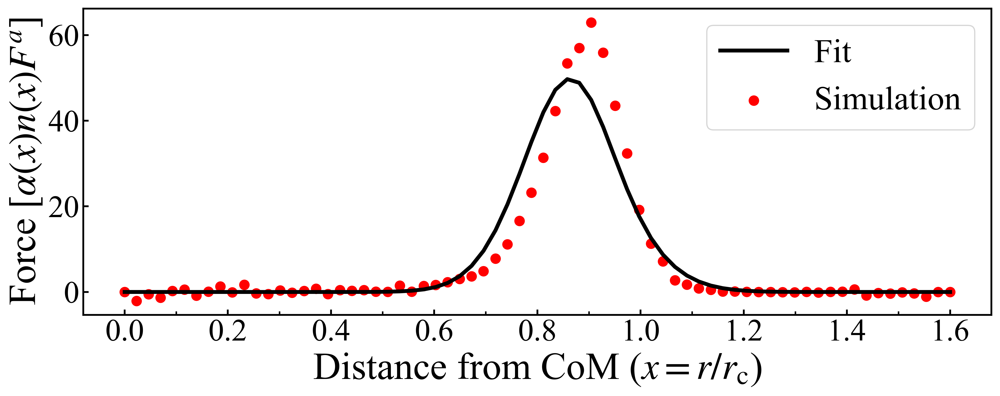

100
250
70.79835506604744


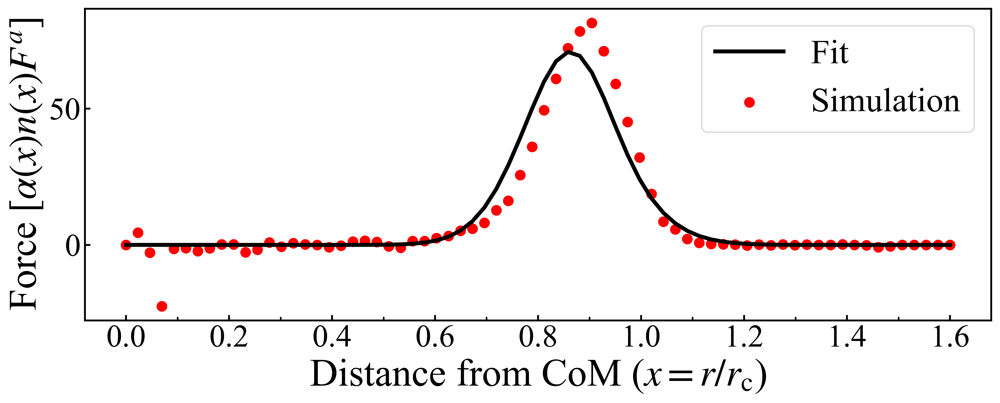

100
100
15.820649970461393


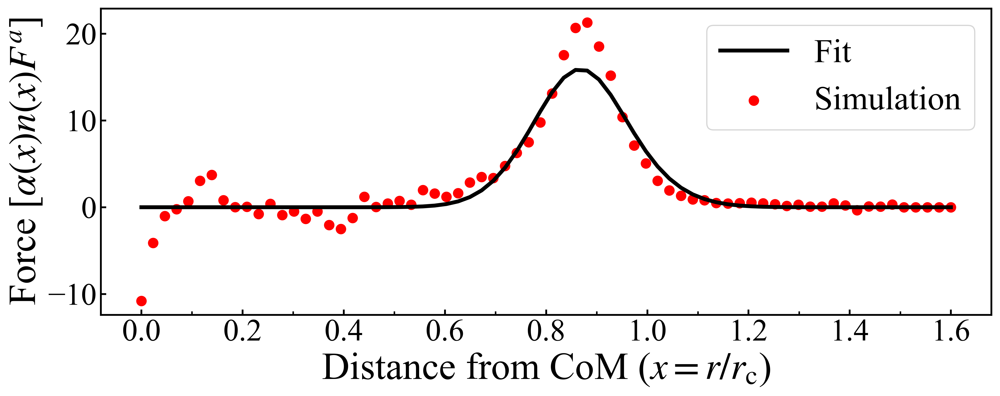

100
150
31.181133130953313


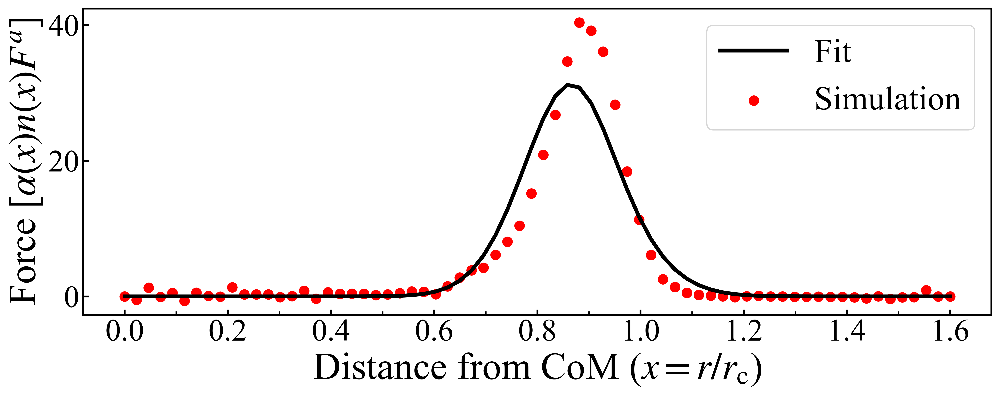

150
350
120.73368030268408


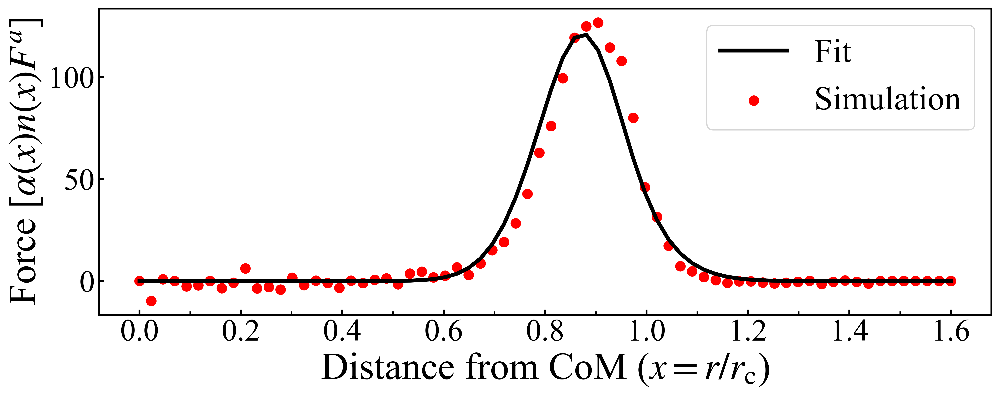

150
200
53.29629406253578


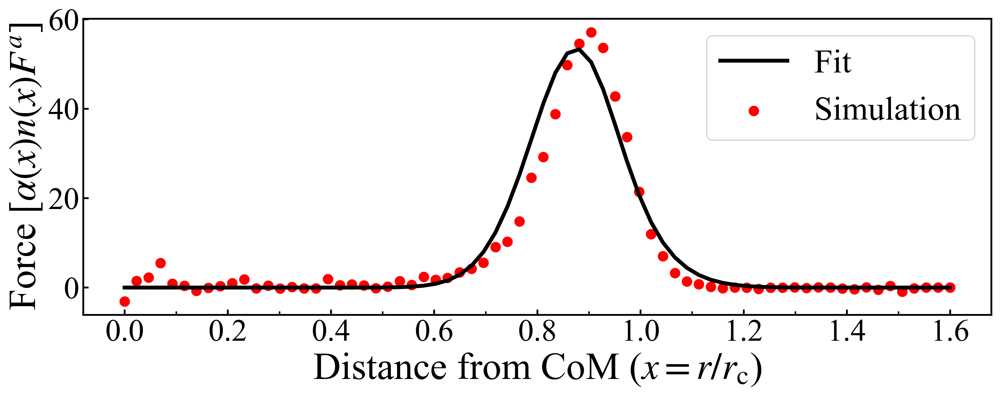

150
450
173.9162522776228


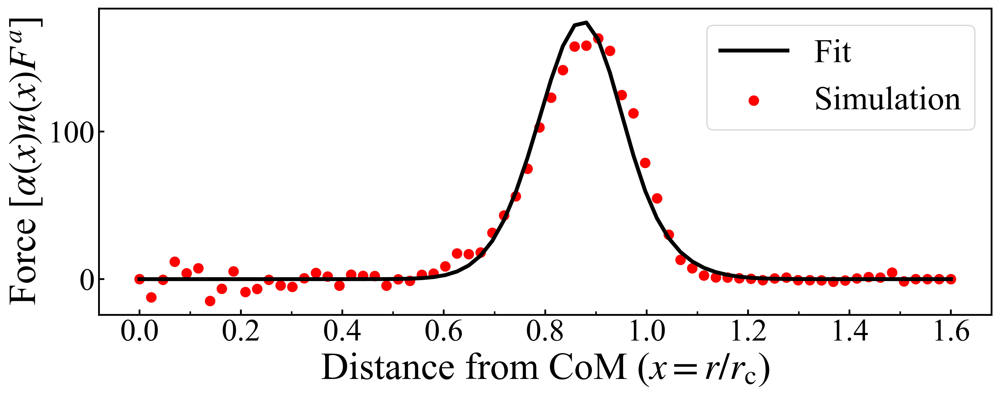

150
250
73.87125242505806


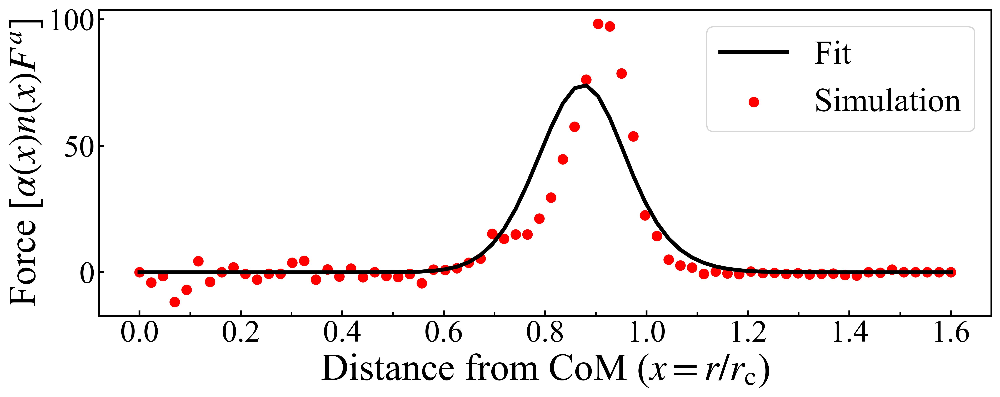

150
150
35.01503069855848


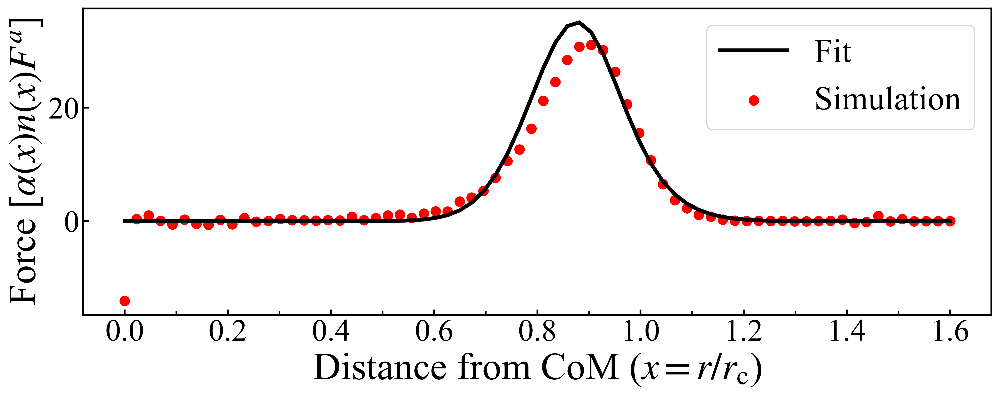

200
450
177.3711463691662


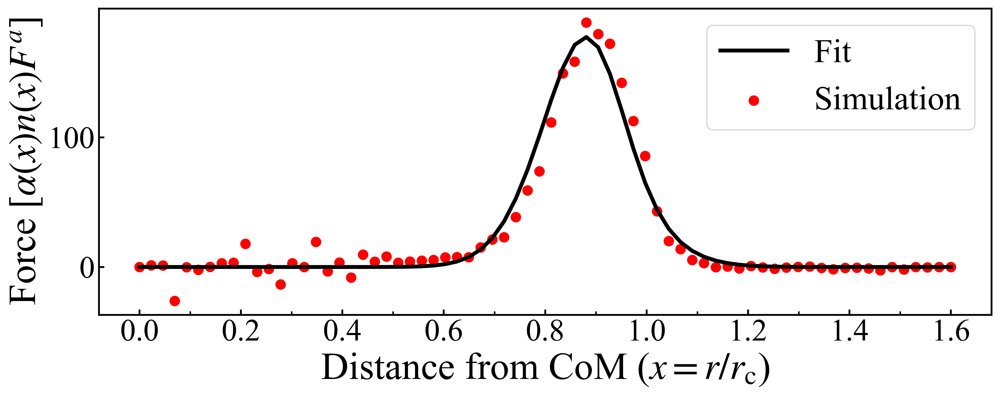

200
350
124.57527819139209


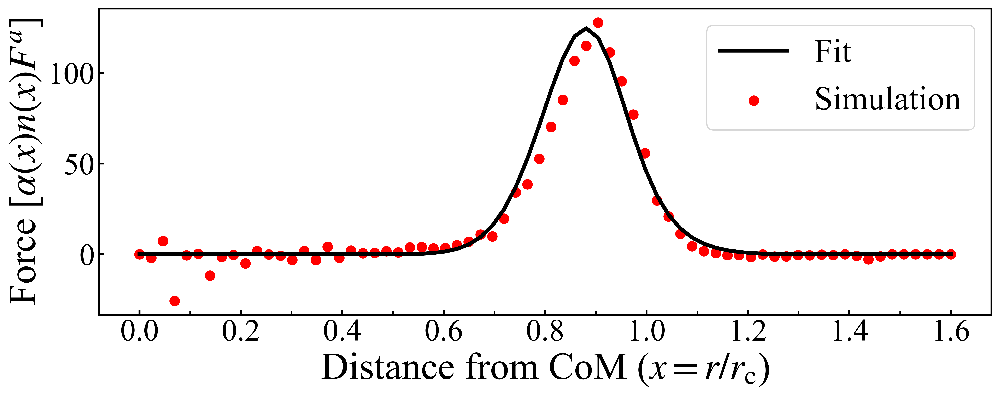

200
200
57.12435184876469


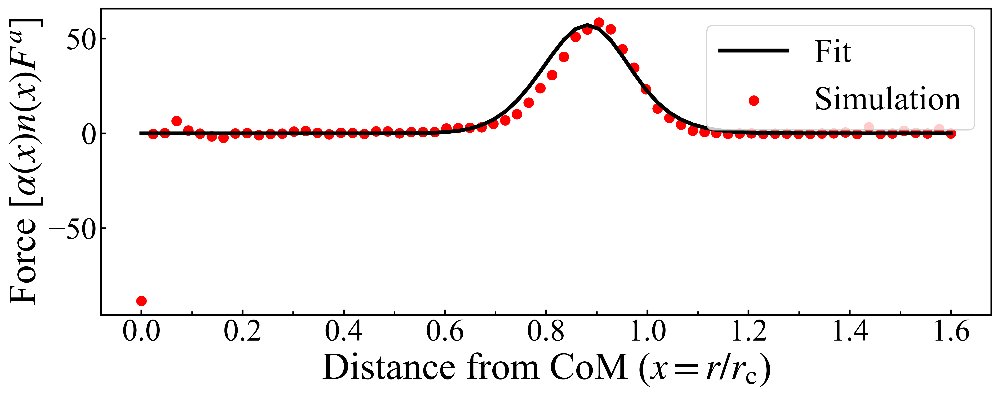

250
250
81.36834678664042


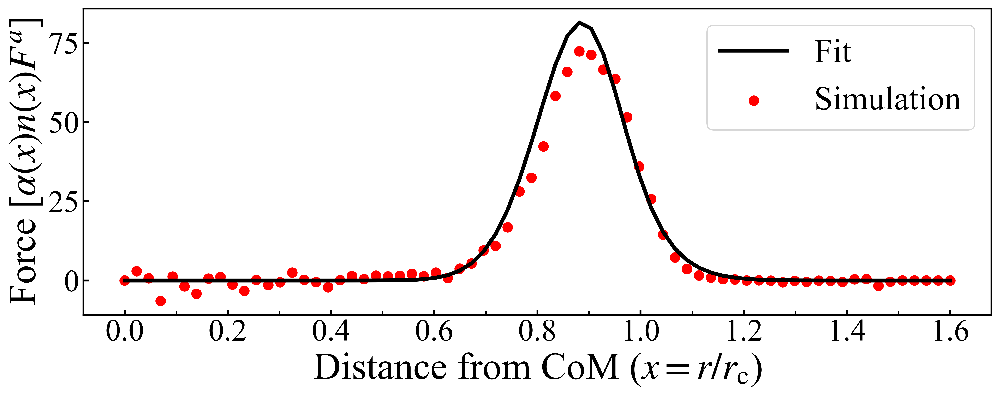

250
350
128.13382147598432


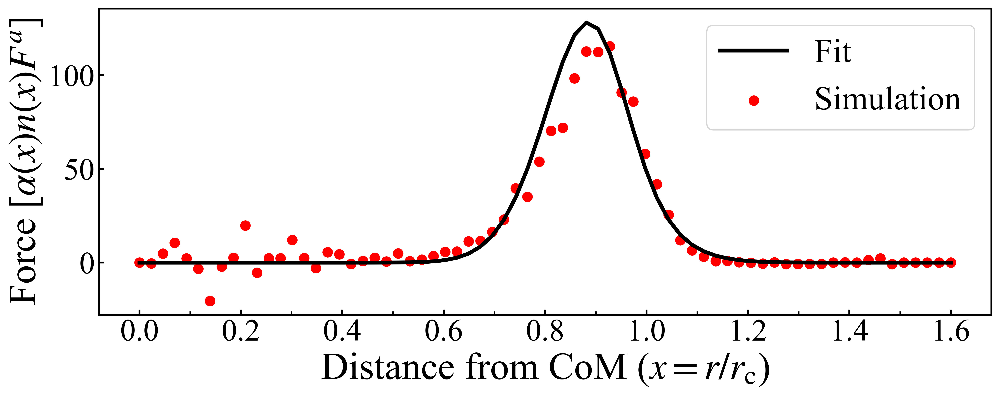

250
450
180.6263920718672


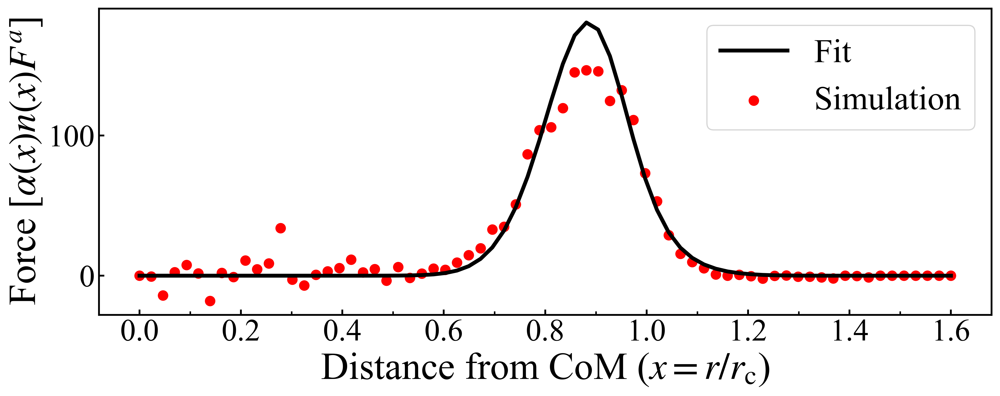

350
350
134.54368828843369


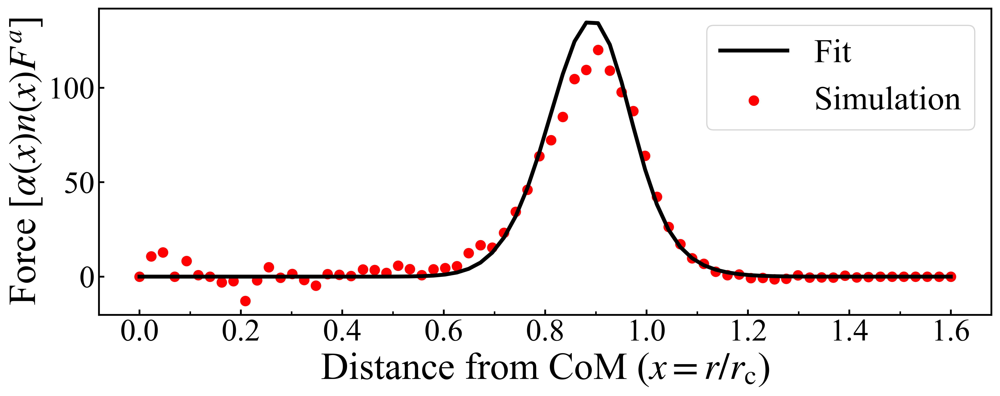

350
450
186.71602550742983


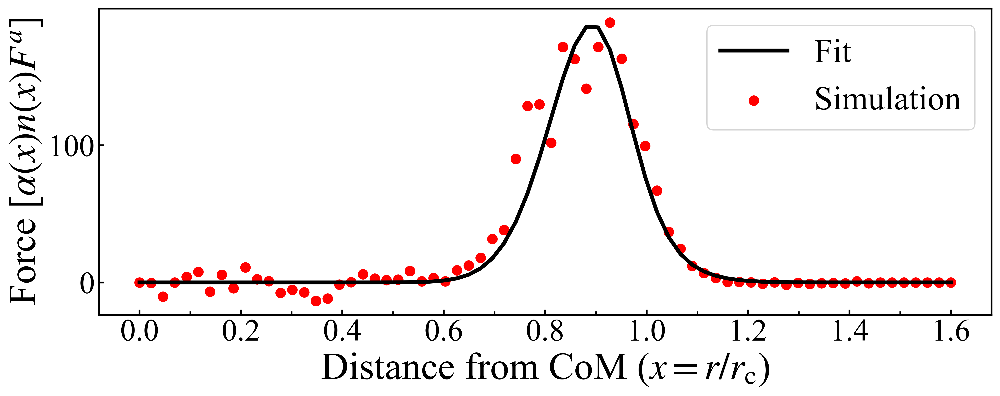

450
450
195.11992172939878


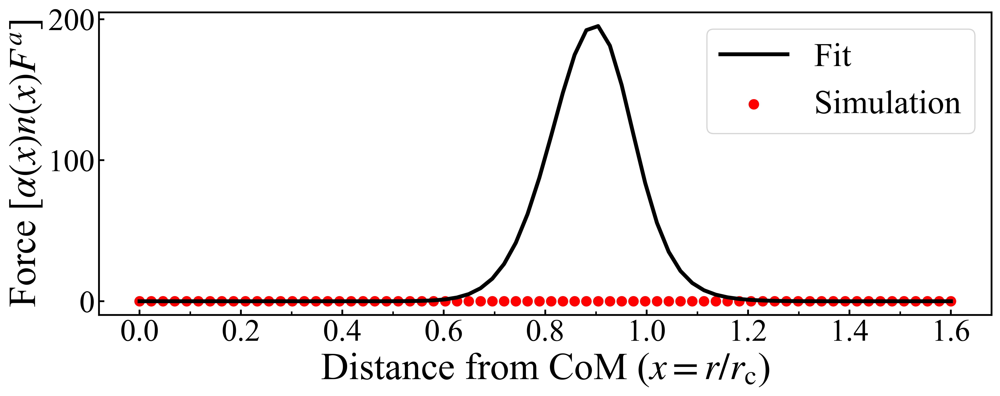

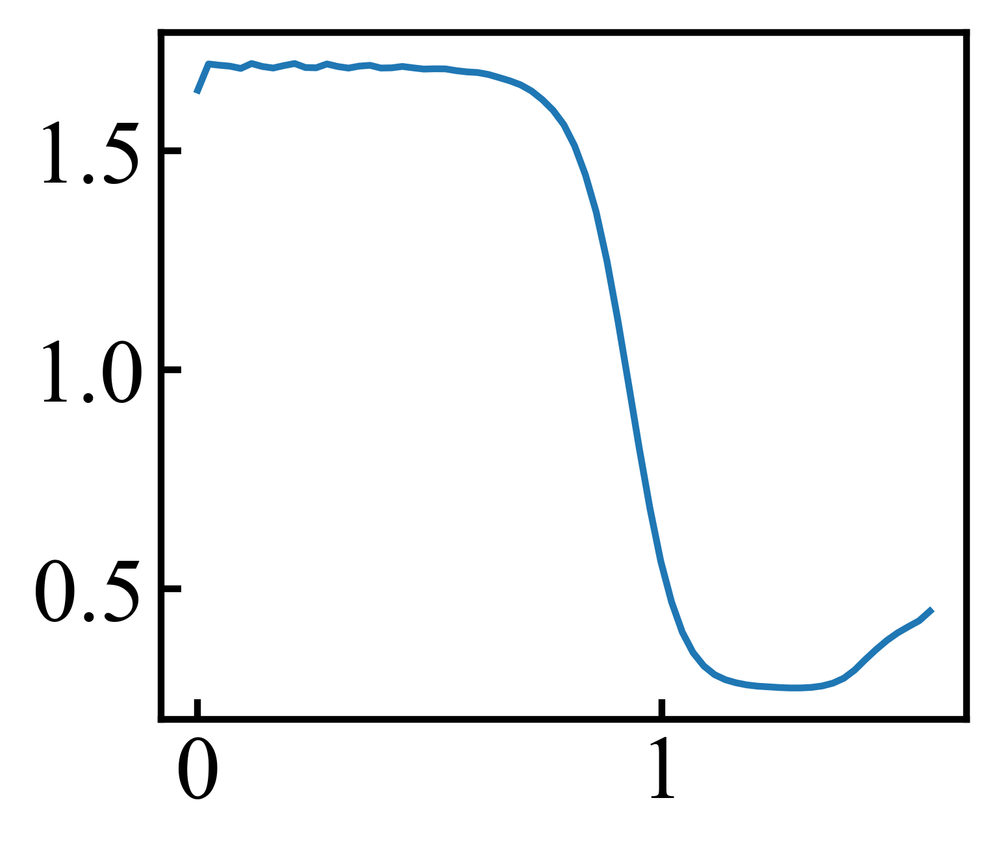

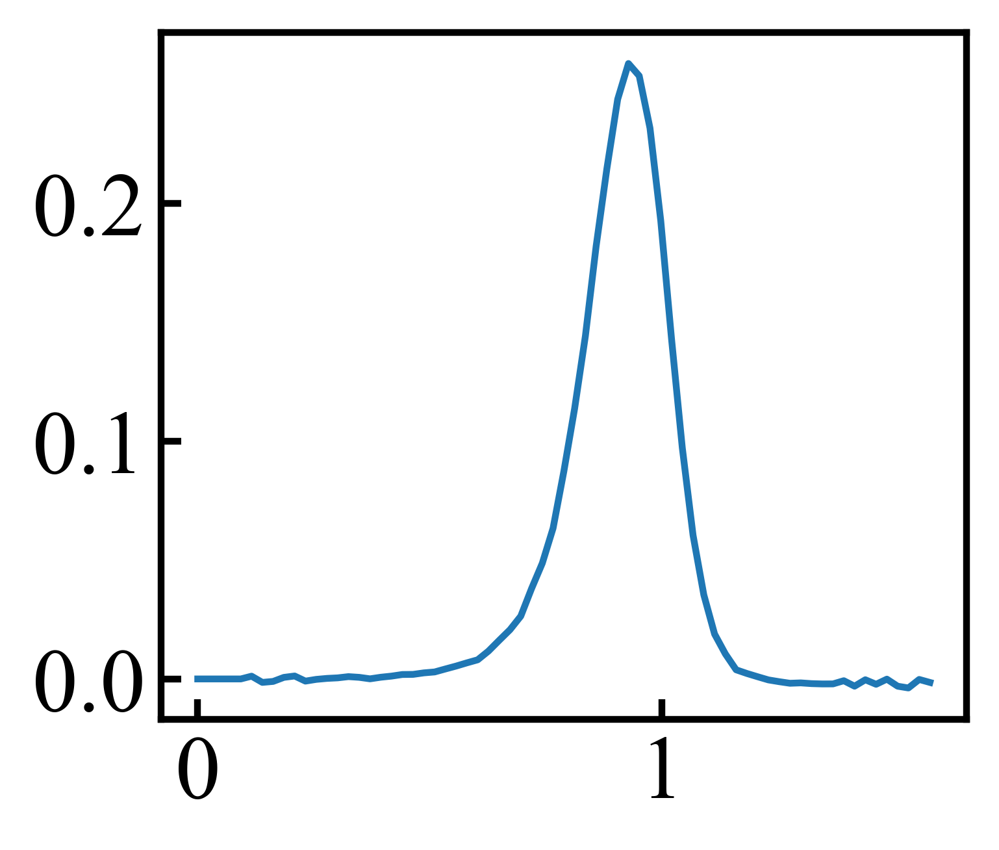

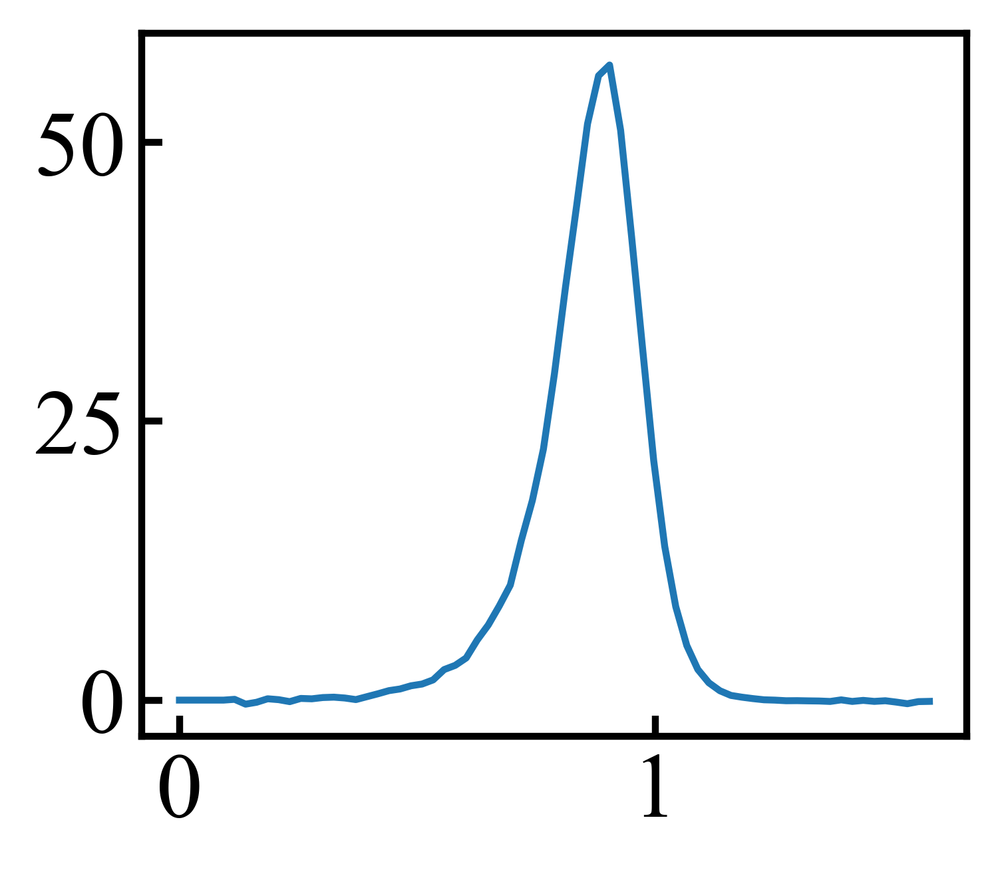

In [31]:
align_peA=np.array([])
align_peB=np.array([])
align_peNet=np.array([])
align_xA=np.array([])
align_eps=np.array([])
align_pnum=np.array([])
align_phi=np.array([])
align_press_arr = np.array([])

radius_arr_final = np.linspace(0,1.6,num=70)
num_dens_arr_final = np.zeros(70)
align_arr_final = np.zeros(70)
press_arr_final = np.zeros(70)
final_count = np.zeros(70)
final_count_count = np.zeros(70)
align_max_arr = np.zeros(len(all_dens))
fita_arr = np.zeros(len(all_dens))
fitb_arr = np.zeros(len(all_dens))
fitc_arr = np.zeros(len(all_dens))
def getLat(peNet, eps):
    '''Get the lattice spacing for any pe'''
    if peNet == 0:
        return 2.**(1./6.)
    out = []
    r = 1.112
    skip = [0.1, 0.01, 0.001, 0.0001, 0.00001, 0.000001, 0.0000001, 0.00000001]
    for j in skip:
        while ljForce(r, eps) < avgCollisionForce(peNet):
            r -= j
        r += j
    return r  
def closest(lst, K):
      
     lst = np.asarray(lst)
     idx = (np.abs(lst - K)).argmin()
     return idx

from scipy.optimize import curve_fit
from scipy.stats import norm


pe_net_arr = np.zeros(len(all_dens))
pe_slow_arr = np.zeros(len(all_dens))

pe_fast_arr = np.zeros(len(all_dens))

tot_press_theory = np.zeros(len(all_dens))
tot_press_sim = np.zeros(len(all_dens))
tot_press_sim2 = np.zeros(len(all_dens))
interpart_press = np.zeros(len(all_dens))
for i in range(0, len(all_dens)):
    for l in range(0, len(all_pres_new)):
        if params['peA'][i]>0:
            #if params['peB'][i]==450:
                if params3['peA'][l]==params['peA'][i]:
                    if params3['peB'][l]==params['peB'][i]:
                        if params3['eps'][l]==params['eps'][i]:
                            if params3['phi'][l]==params['phi'][i]:
                                if params3['xA'][l]==params['xA'][i]:
                                    print(params['peA'][i])
                                    print(params['peB'][i])
                                    num_dens_arr_temp = np.zeros(70)
                                    align_arr_temp = np.zeros(70)
                                    press_arr_temp = np.zeros(70)
                                    temp_count = np.zeros(70)
                                    temp_count_count = np.zeros(70)
                                    pe_net_arr[i] = (params['peA'][i]*params['xA'][i]/100) + params['peB'][i] * ( 1.0-params['xA'][i]/100)
                                    pe_slow_arr[i] = (params['peA'][i])
                                    pe_fast_arr[i] = (params['peB'][i])
                                    # Don't plot non-phase-separated data
                                    if all_dens[i].empty:
                                            continue
                                    time_arr = np.array([])
                                    rat_edge_arr = 0
                                    rat_edge_val = 0

                                    edge_width_sum = 0
                                    edge_width_val = 0


                                    max_size = np.amax(all_dens[i]['clust_size'])
                                    for j in range(0, len(all_dens[i]['clust_size'])):
                                        
                                        time = all_dens[i]['tauB'][j]
                                        time_id = np.where(all_dens[i]['tauB']==time)[0]
                                        time_id2 = np.where(all_pres_new[l]['tauB']==time)[0]
                                        if len(time_id2)>0:
                                            if len(time_id2)==1:
                                                edge_width = all_pres_new[l]['radius'][time_id2[0]]
                                                edge_width_sum += np.max(all_pres_new[l]['radius'][time_id2])
                                                edge_width_val +=1
                                                edge_width2 = np.max(all_pres_new[l]['edge_width'][time_id2])

                                                nB = all_pres_new[l]['Nb'][time_id2[0]]
                                                nA = all_pres_new[l]['Na'][time_id2[0]]
                                                rat_edge = (edge_width - edge_width2) / edge_width
                                                rat_edge_arr+= rat_edge
                                                rat_edge_val += 1
                                            elif len(time_id2)>1:
                                                edge_width = np.max(all_pres_new[l]['radius'][time_id2])
                                                edge_width_sum += np.max(all_pres_new[l]['radius'][time_id2])
                                                edge_width_val +=1
                                                edge_width2 = np.max(all_pres_new[l]['edge_width'][time_id2])

                                                nB = np.max(all_pres_new[l]['Nb'][time_id2])
                                                nA = np.max(all_pres_new[l]['Na'][time_id2])
                                                rat_edge = (edge_width - edge_width2) / edge_width
                                                rat_edge_arr+= rat_edge
                                                rat_edge_val += 1
                                                if time not in time_arr:
                                                    time_arr = np.append(time_arr, time)  
                                                    if len(time_arr)>=2:
                                                        if np.max(radius_arr)<edge_width:
                                                            for k in range(0, len(radius_arr_final)-1):
                                                                rad_where = np.where((radius_arr_final[k]<=radius_arr) & (radius_arr<radius_arr_final[k+1]))[0]
                                                                if len(rad_where)>0:
                                                                    nonzero_align = np.where(align_arr[rad_where]!=0)[0]
                                                                    if len(nonzero_align)>0:
                                                                        press_arr_final[k]+=np.mean(press_arr[rad_where][nonzero_align])
                                                                        align_arr_final[k]+=np.mean(align_arr[rad_where][nonzero_align])
                                                                        num_dens_arr_final[k]+=np.mean(num_dens_arr[rad_where][nonzero_align])
                                                                        final_count[k]+=1
                                                                        final_count_count[k]+=len(rad_where)
                                                                        
                                                                        press_arr_temp[k]+=np.mean(press_arr[rad_where][nonzero_align])
                                                                        align_arr_temp[k]+=np.mean(align_arr[rad_where][nonzero_align])
                                                                        num_dens_arr_temp[k]+=np.mean(num_dens_arr[rad_where][nonzero_align])
                                                                        temp_count[k]+=1
                                                                        temp_count_count[k]+=len(rad_where)
                                                                        
                                                    radius_arr = np.array([])
                                                    align_arr = np.array([])
                                                    num_dens_arr = np.array([])
                                                    press_arr = np.array([])
                                                    radius_arr = np.append(radius_arr, all_dens[i]['r_max'][j]/edge_width)   
                                                    align_arr = np.append(align_arr, all_dens[i]['align'][j])   
                                                    num_dens_arr = np.append(num_dens_arr, all_dens[i]['num_dens'][j])   
                                                    press_arr = np.append(press_arr, all_dens[i]['press'][j])   
                                                else:
                                                    radius_arr = np.append(radius_arr, all_dens[i]['r_max'][j]/edge_width)   
                                                    align_arr = np.append(align_arr, all_dens[i]['align'][j])   
                                                    num_dens_arr = np.append(num_dens_arr, all_dens[i]['num_dens'][j])   
                                                    press_arr = np.append(press_arr, all_dens[i]['press'][j]) 

                                    
                                    for q in range(0, len(align_arr_temp)):
                                        if temp_count[q]>0:
                                            align_arr_temp[q]=align_arr_temp[q]/temp_count[q]
                                            num_dens_arr_temp[q]=num_dens_arr_temp[q]/temp_count[q]
                                            #align_arr_temp[q]=align_arr_temp[q]/temp_count[q]
                                    latNet = getLat(pe_net_arr[i], 1.0)
                                    phi_theory = latToPhi(latNet) / (np.pi/4)
                                    rad_max = np.where(num_dens_arr_temp!=0)[0]
                                    #A=0.00048*pe_net_arr[i]+0.1648
                                    #y = np.zeros(len(x))
                                    #for q in range(0, len(x)):
                                    A=0.865659*np.log10(pe_net_arr[i]-46.992486)-0.442903
                                    #A=phi_theory - phi_g_theory
                                    B=-6.150813*np.log10(pe_net_arr[i]-49.921377)-4.391976
                                    C=0.043935*np.log10(pe_slow_arr[i]-49.892980)+0.835921
                                    #D=phi_g_theory
                                    D=-0.259766*np.log10(pe_slow_arr[i]-41.741660)+0.782493

                                    num_dens_theory = A/(1+np.exp(-B*(radius_arr_final-C)))+D
                                    
                                    A=0.2019*np.log10(pe_net_arr[i]-41.2803)-0.1885
                                    B=0.0492*np.log10(pe_slow_arr[i]-47.0061)+0.8220
                                    C=0.1057
                                    #y = np.zeros(len(x))
                                    #for q in range(0, len(x)):
                                    align_theory = A*np.exp(-(radius_arr_final-B)**2/(2*C**2))
                                    press_theory = align_theory * num_dens_theory
                                    
                                    press_theory = align_theory * num_dens_theory * pe_fast_arr[i]
                                    edge_width_mean = edge_width_sum / edge_width_val
                                    for m in range(1, len(press_theory)):
                                        tot_press_theory[i] += ((press_theory[m-1] + press_theory[m])/2)*(radius_arr_final[m]-radius_arr_final[m-1])*edge_width_mean
                                    print(np.max(press_theory))
                                    fig, ax1 = plt.subplots(figsize=(12,5))
                                    plt.scatter(radius_arr_final, num_dens_arr_temp * align_arr_temp * pe_fast_arr[i], marker='o', color='red', s=60, label='Simulation')
                                    plt.plot(radius_arr_final, press_theory, '-', color='black', label='Fit',lw=1.8*1.8)
                                    # Set all the x ticks for radial plots
                                    loc = ticker.MultipleLocator(base=0.2)
                                    ax1.xaxis.set_major_locator(loc)
                                    loc = ticker.MultipleLocator(base=0.1)
                                    ax1.xaxis.set_minor_locator(loc)
                                   # Set y ticks
                                    #loc = ticker.MultipleLocator(base=40)
                                    #ax1.yaxis.set_major_locator(loc)
                                    #loc = ticker.MultipleLocator(base=20)
                                    #ax1.yaxis.set_minor_locator(loc)


                                    ax1.tick_params(axis='x', labelsize=26)
                                    ax1.tick_params(axis='y', labelsize=26)
                                    ax1.set_xlabel(r'Distance from CoM ($x=r/r_\mathrm{c}$)', fontsize=32)
                                    ax1.set_ylabel(r'Force [$\alpha(x) n(x) F^a$]', fontsize=32)
                                    #ax1.set_ylim([-0.05,1.05])
                                    props = dict(boxstyle='square', facecolor='white', edgecolor='none', alpha=0.85, pad=0.1)
                                    #ax1.text(0.44, 0.88, r'$y=(0.00047\mathrm{Pe}_\mathrm{Net}+0.165)e^{-(x-0.925)^2/(2\times0.093^2)}$', zorder=10,
                                    #           transform=ax1.transAxes,
                                    #           fontsize=22,fontdict={'fontname':'Helvetica'}, bbox=props)  
                                    plt.legend(loc='upper right', fontsize=28)
                                    #ax1.set_ylim(bottom=0)
                                    plt.tight_layout()
                                    plt.show()
                                    ind_min = closest(radius_arr_final, 0.6)
                                    ind_max = closest(radius_arr_final, 1.2)
                                    for m in range(1, len(radius_arr_final)):
                                        tot_press_sim[i] += ((num_dens_arr_temp[m-1] * align_arr_temp[m-1] * pe_fast_arr[i] + num_dens_arr_temp[m] * align_arr_temp[m] * pe_fast_arr[i])/2) * (radius_arr_final[m]-radius_arr_final[m-1])*edge_width_mean 
                                    for m in range(ind_min+1, ind_max):
                                        tot_press_sim2[i] += ((num_dens_arr_temp[m-1] * align_arr_temp[m-1] * pe_fast_arr[i] + num_dens_arr_temp[m] * align_arr_temp[m] * pe_fast_arr[i])/2) * (radius_arr_final[m]-radius_arr_final[m-1])*edge_width_mean 
                                    interpart_press[i] = 4 * np.sqrt(3) *  pe_slow_arr[i] / latNet
                                    #plt.plot(radius_arr_done, num_dens_arr_done, 'o', label='data')
                                    #plt.plot(radius_arr_done, fit_y2, '-', label='fit')
                                    #plt.legend()
                                    #plt.show()

                                    #plt.scatter(radius_arr_done, align_arr_done, c='green')
                                    #plt.show()

                                    #plt.scatter(radius_arr_done, num_dens_arr_done, c='red')
                                    #plt.show()

                                    #plt.scatter(radius_arr_final, final_count_count, c='blue')
                                    #plt.show()

press_arr_done = np.array([])
align_arr_done = np.array([])
num_dens_arr_done = np.array([])
radius_arr_done = np.array([])
align_arr_final[0:5]=0
press_arr_final[0:5]=0
for i in range(0, len(press_arr_final)):
    if final_count[i]>0:
            press_arr_done = np.append(press_arr_done, press_arr_final[i]/final_count[i])
            align_arr_done = np.append(align_arr_done, align_arr_final[i]/final_count[i])
            if (i<len(press_arr_final)-3) & (i>=2):
                num_dens_arr_done = np.append(num_dens_arr_done, np.sum(num_dens_arr_final[i-2:i+3])/np.sum(final_count[i-2:i+3]))
            else:
                num_dens_arr_done = np.append(num_dens_arr_done, num_dens_arr_final[i]/final_count[i])

            radius_arr_done = np.append(radius_arr_done, radius_arr_final[i])
plt.plot(radius_arr_done, num_dens_arr_done)
plt.show()
plt.plot(radius_arr_done, align_arr_done)
plt.show()
plt.plot(radius_arr_done, press_arr_done)
plt.show()

mean D
1.3880640690807053
STD D
10.16255196338103
0.45612499999999995
0.557755


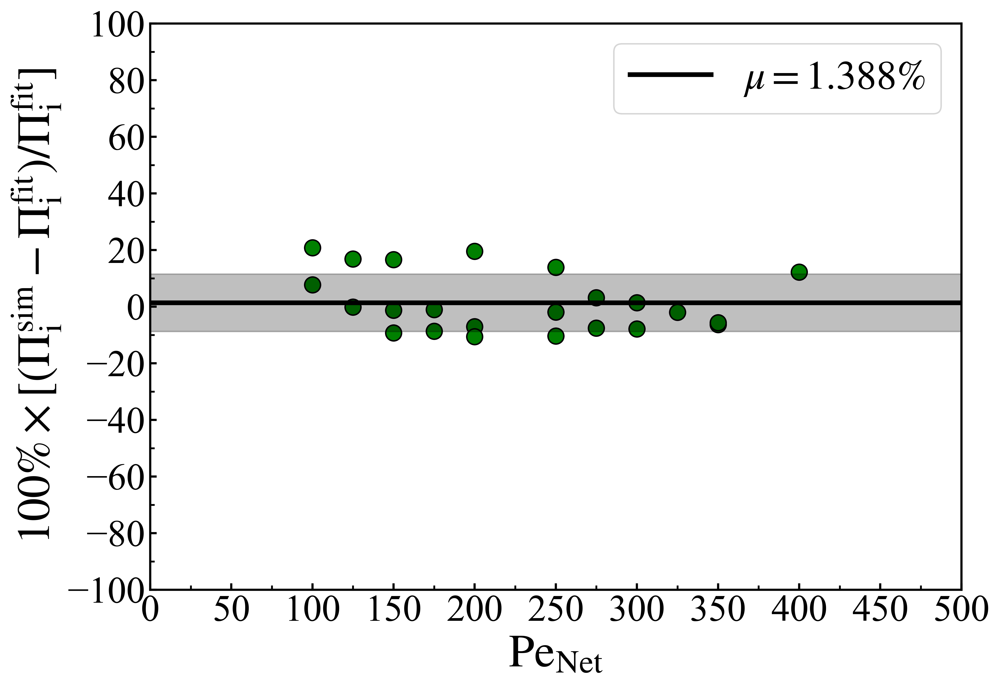

In [36]:
nonzero_c = np.where((pe_net_arr>=50) & (pe_net_arr!=450))[0]

percent_error = ((tot_press_sim2[nonzero_c]-tot_press_theory[nonzero_c])/tot_press_theory[nonzero_c])*100

print('mean D')
print(np.mean(percent_error))

sume=0

for i in range(0, len(percent_error)):
    sume+=(percent_error[i]-np.mean(percent_error))**2

std_e = (sume/len(percent_error))**0.5

print('STD D')
print(std_e)

div_min = -3
min_n = 0
max_n = 20
levels_text=40
level_boundaries = np.linspace(min_n, max_n, levels_text + 1)
tick_locs   = [0.0,np.pi/6,np.pi/3]
tick_labels = ['0',r'$\pi/6$',r'$\pi/3$']


fig, ax1 = plt.subplots(figsize=(10,7))

ax1.scatter(pe_net_arr[nonzero_c], percent_error, linewidths=1.0, edgecolor='black', facecolor='green', s=120.0)
x_span = np.linspace(0,500, num=500)
y_val = np.ones(len(x_span)) * 1.388
ymin_val = ((1.388 - 10.163)+100)/200
ymax_val = ((1.388+10.163)+100)/200
print(ymin_val)
print(ymax_val)
plt.plot(x_span, y_val, color='black', linewidth=1.8*1.8, label=r'$\mu=1.388\%$')      
plt.axvspan(0, 500, ymin=ymin_val, ymax=ymax_val, color='black', alpha=0.25)     
# Set all the x ticks for radial plots
loc = ticker.MultipleLocator(base=50)
ax1.xaxis.set_major_locator(loc)
loc = ticker.MultipleLocator(base=25)
ax1.xaxis.set_minor_locator(loc)


# Set y ticks
loc = ticker.MultipleLocator(base=20.0)
ax1.yaxis.set_major_locator(loc)
loc = ticker.MultipleLocator(base=10)
ax1.yaxis.set_minor_locator(loc)
    
ax1.tick_params(axis='x', labelsize=26)
ax1.tick_params(axis='y', labelsize=26)
ax1.set_xlabel(r'$\mathrm{Pe}_\mathrm{Net}$', fontsize=32)
ax1.set_ylabel(r'$100\%\times[(\Pi_\mathrm{i}^\mathrm{sim}-\Pi_\mathrm{i}^\mathrm{fit})/\Pi_\mathrm{i}^\mathrm{fit}]$', fontsize=32)
ax1.set_ylim([-100,100])
ax1.set_xlim([0,500])
plt.legend(loc='upper right', fontsize=28)
plt.tight_layout()
plt.show()

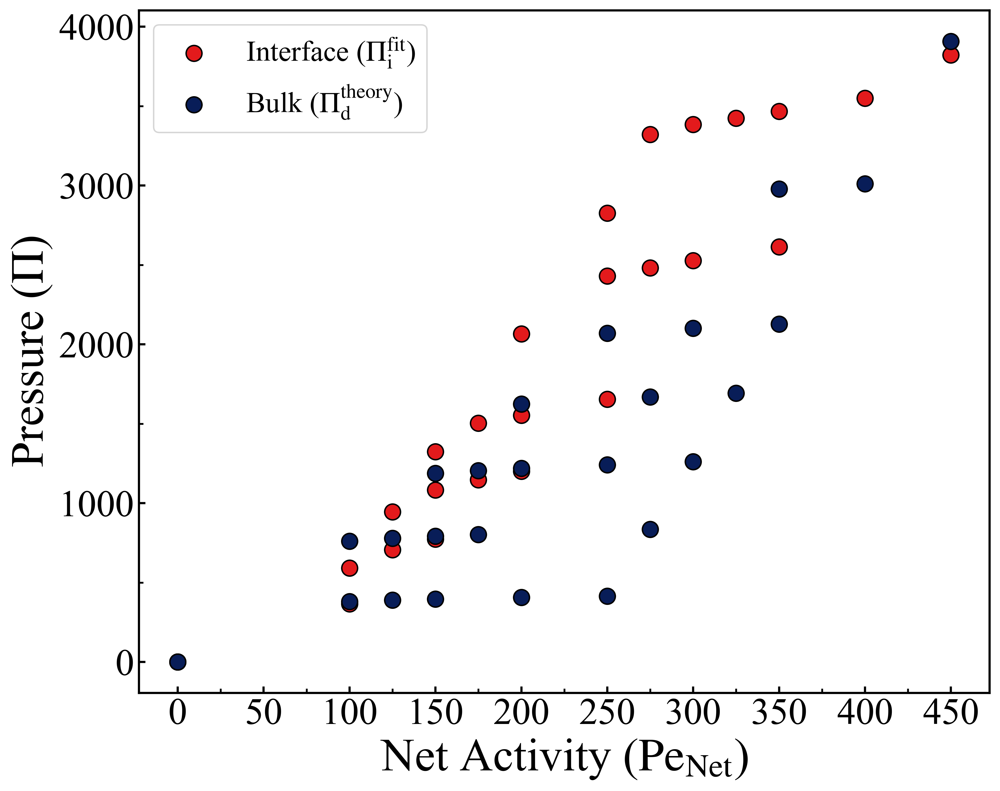

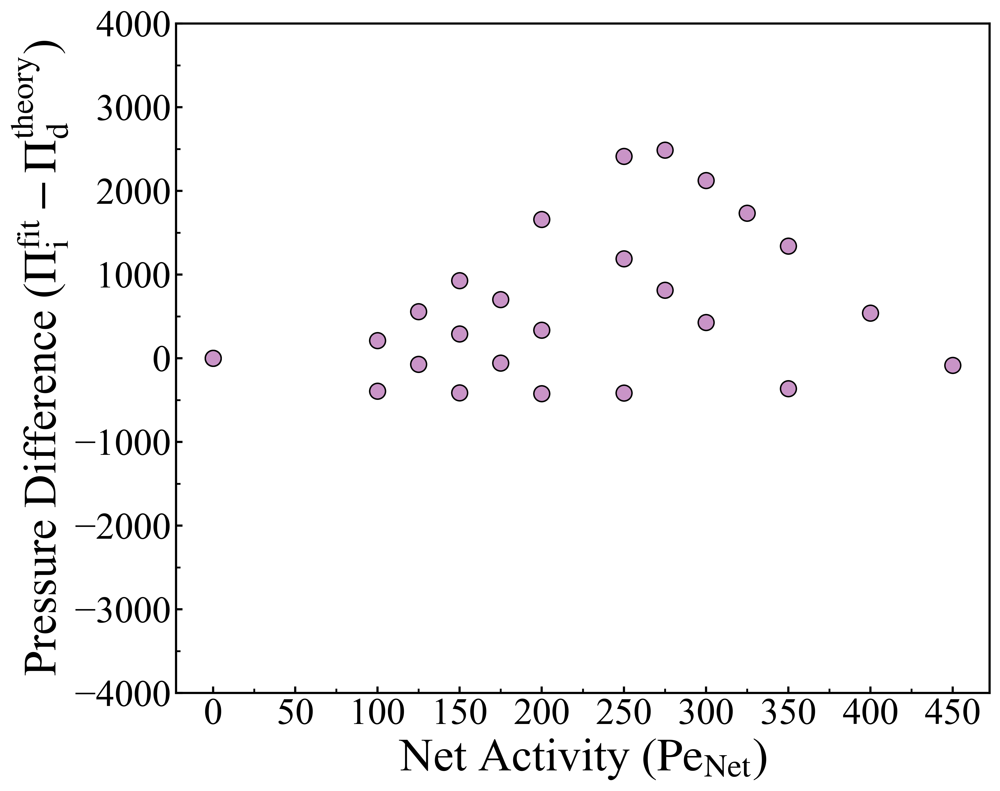

In [38]:
fastCol = '#e31a1c'
slowCol = '#081d58'

fig, ax1 = plt.subplots(figsize=(10,8))
plt.scatter(pe_net_arr, tot_press_theory, marker='o', linewidths=1.0, edgecolor='black', color=fastCol, s=120, label=r'Interface ($\Pi_\mathrm{i}^\mathrm{fit}$)')
plt.scatter(pe_net_arr, interpart_press, marker='o', linewidths=1.0, edgecolor='black', color=slowCol, s=120, label=r'Bulk ($\Pi_\mathrm{d}^\mathrm{theory}$)')
# Set all the x ticks for radial plots
loc = ticker.MultipleLocator(base=50)
ax1.xaxis.set_major_locator(loc)
loc = ticker.MultipleLocator(base=25)
ax1.xaxis.set_minor_locator(loc)
# Set y ticks
loc = ticker.MultipleLocator(base=1000)
ax1.yaxis.set_major_locator(loc)
loc = ticker.MultipleLocator(base=500)
ax1.yaxis.set_minor_locator(loc)


ax1.tick_params(axis='x', labelsize=26)
ax1.tick_params(axis='y', labelsize=26)
ax1.set_xlabel(r'Net Activity ($\mathrm{Pe}_\mathrm{Net}$)', fontsize=32)
ax1.set_ylabel(r'Pressure ($\Pi$)', fontsize=32)
#ax1.set_ylim([-0.05,1.05])
props = dict(boxstyle='square', facecolor='white', edgecolor='none', alpha=0.85, pad=0.1)
#ax1.text(0.44, 0.88, r'$y=(0.00047\mathrm{Pe}_\mathrm{Net}+0.165)e^{-(x-0.925)^2/(2\times0.093^2)}$', zorder=10,
#           transform=ax1.transAxes,
#           fontsize=22,fontdict={'fontname':'Helvetica'}, bbox=props)  
plt.legend(loc='upper left')
plt.tight_layout()
plt.show()

medCol = '#c994c7'

fig, ax1 = plt.subplots(figsize=(10,8))
plt.scatter(pe_net_arr, tot_press_theory-interpart_press, marker='o', linewidths=1.0, edgecolor='black', color=medCol, s=120, label=r'Interface ($\Pi_\mathrm{i}^\mathrm{fit}$)')
#plt.scatter(pe_net_arr, interpart_press, marker='o', linewidths=1.0, edgecolor='black', color=fastCol, s=120, label='Bulk')
# Set all the x ticks for radial plots
loc = ticker.MultipleLocator(base=50)
ax1.xaxis.set_major_locator(loc)
loc = ticker.MultipleLocator(base=25)
ax1.xaxis.set_minor_locator(loc)
# Set y ticks
loc = ticker.MultipleLocator(base=1000)
ax1.yaxis.set_major_locator(loc)
loc = ticker.MultipleLocator(base=500)
ax1.yaxis.set_minor_locator(loc)


ax1.tick_params(axis='x', labelsize=26)
ax1.tick_params(axis='y', labelsize=26)
ax1.set_xlabel(r'Net Activity ($\mathrm{Pe}_\mathrm{Net}$)', fontsize=32)
ax1.set_ylabel(r'Pressure Difference ($\Pi_\mathrm{i}^\mathrm{fit}-\Pi_\mathrm{d}^\mathrm{theory}$)', fontsize=32)
ax1.set_ylim([-4000,4000])
props = dict(boxstyle='square', facecolor='white', edgecolor='none', alpha=0.85, pad=0.1)
#ax1.text(0.44, 0.88, r'$y=(0.00047\mathrm{Pe}_\mathrm{Net}+0.165)e^{-(x-0.925)^2/(2\times0.093^2)}$', zorder=10,
#           transform=ax1.transAxes,
#           fontsize=22,fontdict={'fontname':'Helvetica'}, bbox=props)  
plt.tight_layout()
plt.show()